In [1]:
import os

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Subset, ConcatDataset

import cv2
import numpy as np
import pandas as pd
from tqdm import tqdm
import random

In [2]:
import segmentation_models_pytorch as smp
from segmentation_models_pytorch.losses import DiceLoss
from segmentation_models_pytorch.utils.metrics import IoU, Fscore, Accuracy

In [3]:
import matplotlib.pyplot as plt

# helper function for data visualization
def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image, 'gray')
    plt.show()

# Settings

In [4]:
root = os.getcwd()
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

BATCH = 16
GEN_IN_CHANNELS = 1
GEN_N_CLASSES = 1
DIS_IN_CHANNELS = 1
DIS_N_CLASSES = 1
EPOCH = 100

### Model Settings

#### head

In [5]:
GEN_ACT = "sigmoid"
DIS_ACT = "sigmoid"

### Optimizer Settings

In [6]:
ENCODER = "resnet34"
ENCODER_WEIGHT = None
DECODER_ATT = "scse"
GEN_OPTIM_NAME = "adam"
GEN_init_lr = 3e-4
GEN_momentum = 0.9

In [7]:
DIS_OPTIM_NAME = "adam"
DIS_init_lr = 1e-3
DIS_momentum = 0.9

# Epochs

In [8]:
from codes.activation import Activation
from kornia.filters.canny import Canny

In [9]:
def set_requires_grad(nets, requires_grad=False):
    """Set requies_grad=Fasle for all the networks to avoid unnecessary computations
    Parameters:
    nets (network list)   -- a list of networks
    requires_grad (bool)  -- whether the networks require gradients or not
    """
    if not isinstance(nets, list):
        nets = [nets]
        for net in nets:
            if net is not None:
                for param in net.parameters():
                    param.requires_grad = requires_grad

In [10]:
def replace_relu_to_leakyReLU(model):
    for child_name, child in model.named_children():
        if isinstance(child, nn.ReLU):
            setattr(model, child_name, nn.LeakyReLU())
        else:
            replace_relu_to_leakyReLU(child)

In [11]:
def replace_bn_to_instanceNorm(model):
    for child_name, child in model.named_children():
        if isinstance(child, nn.BatchNorm2d):
            bn = getattr(model, child_name)
            setattr(model, child_name, nn.InstanceNorm2d(bn.num_features))
        else:
            replace_bn_to_instanceNorm(child)

In [12]:
canny_filter = Canny(low_threshold=0, high_threshold=0.1).to(device)

In [13]:
def train_a2b_epoch(generator, gen_optimizer, discriminator, dis_optimizer, dataloader, device):
  
    # change mode to train and move to current device
    generator = generator.train().to(device)
    discriminator = discriminator.train().to(device)
    
    dis_l = 0
    gen_l = 0

    for index, data in tqdm(enumerate(dataloader)):

        x, y, *_ = data

        x = x.to(device)
        y = y.to(device)

        *_, edge_x = canny_filter(x)
        *_, edge_y = canny_filter(y)  

        edge_y_pr = generator(edge_x)
        edge_y_pr = Activation(name=GEN_ACT)(edge_y_pr) # zipped value to [0, 1]
        
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        set_requires_grad(discriminator, True)
        dis_optimizer.zero_grad()
        
        y_cls = discriminator(edge_y)
        y_cls = Activation(name=DIS_ACT)(y_cls)
        
        y_pr_cls = discriminator(edge_y_pr.detach())
        y_pr_cls = Activation(name=DIS_ACT)(y_pr_cls)
       
        _dis = nn.BCELoss()(y_cls.float(), torch.ones(y_cls.size(), dtype=torch.float, device=device)) + \
                                nn.BCELoss()(y_pr_cls.float(), torch.zeros(y_pr_cls.size(), dtype=torch.float, device=device))

        _dis.backward()
        dis_optimizer.step()
        
        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        set_requires_grad(discriminator, False)
        gen_optimizer.zero_grad()

        # adversarial loss
        y_pr_cls = discriminator(edge_y_pr)
        y_pr_cls = Activation(name=DIS_ACT)(y_pr_cls)
        _gen = nn.BCELoss()(y_pr_cls.float(), torch.ones(y_pr_cls.size(), dtype=torch.float, device=device))

        _gen.backward()    
        gen_optimizer.step()

        dis_l += _dis.item()
        gen_l += _gen.item()
        
    return  gen_l/(index+1), dis_l/(index+1)

In [14]:
@torch.no_grad()
def eval_epoch(generator, discriminator, dataloader, device):
  
    # change mode to train and move to current device
    generator = generator.eval().to(device)
    discriminator = discriminator.eval().to(device)

    acc_ = []
    for index, data in tqdm(enumerate(dataloader)):

        x, y, *_ = data

        x = x.to(device)
        y = y.to(device)

        *_, edge_x = canny_filter(x)
        *_, edge_y = canny_filter(y)  

        edge_y_pr = generator(edge_x)
        edge_y_pr = Activation(name=GEN_ACT)(edge_y_pr) # zipped value to [0, 1]
        
        y_cls = discriminator(edge_y)
        y_cls = Activation(name=DIS_ACT)(y_cls)
        y_pr_cls = discriminator(edge_y_pr)
        y_pr_cls = Activation(name=DIS_ACT)(y_pr_cls)
        
        # adversarial
        y_cls = torch.where(y_cls > 0.5, 1, 0)
        acc = Accuracy()(y_cls, torch.ones(y_cls.size(), device=y_cls.device))
        acc_ += [acc.item()]
        y_pr_cls = torch.where(y_pr_cls > 0.5, 1, 0)
        acc = Accuracy()(y_pr_cls, torch.zeros(y_pr_cls.size(), device=y_pr_cls.device))
        acc_ += [acc.item()]


    return  sum(acc_)/len(acc_)

In [15]:
@torch.no_grad()
def test_epoch(model, dataloader, device, save=False, path=None):
  
    # change mode to train and move to current device
    model = model.eval().to(device)
    
    iid = 0
    for index, data in tqdm(enumerate(dataloader)):

        x, y, *_ = data

        x = x.to(device)
        y = y.to(device)

        *_, edge_x = canny_filter(x)
        *_, edge_y = canny_filter(y)  

        edge_y_pr = model(edge_x)
        edge_y_pr = Activation(name=GEN_ACT)(edge_y_pr) # zipped value to [0, 1]
        
        y_cls = discriminator(edge_y)
        y_cls = Activation(name=DIS_ACT)(y_cls)
        y_pr_cls = discriminator(edge_y_pr)
        y_pr_cls = Activation(name=DIS_ACT)(y_pr_cls)   
        
        for b in range(x.shape[0]):
            
            print("edge of ct_pred = {}, edge of ct_true = {}".format(y_pr_cls[b, :].squeeze().item(), y_cls[b, :].squeeze().item()))
            print(torch.min(edge_y[b, :]), torch.max(edge_y[b, :]), torch.min(edge_y_pr[b, :]), torch.max(edge_y_pr[b, :]))
            
            _edge = edge_y[b, :].squeeze().cpu().numpy()
            _edge_pr = edge_y_pr[b, :].squeeze().cpu().numpy()
            
            visualize(
                edge_true = _edge,
                edge_pred = _edge_pr
            )
            
            if save:
                path_dir = os.path.join(path, "file_{}".format(iid))
                try:
                    os.mkdir(path_dir)
                except FileExistsError:
                    pass
                
                cv2.imwrite(os.path.join(path_dir, "edge_pred.jpg"), (_edge_pr * 255).astype(np.uint8))
                cv2.imwrite(os.path.join(path_dir, "edge_true.jpg"), (_edge * 255).astype(np.uint8))
                
            iid += 1

# Discriminator

In [16]:
from codes.activation import Activation
import torchvision.models as models

In [17]:
class Model(nn.Module):
    def __init__(self, in_channel=1, n_classes=2, activation=None):
        
        super(Model, self).__init__()
        
        encoder = models.resnet34()
        encoder.conv1 = nn.Conv2d(in_channel, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
        encoder.fc = nn.Linear(in_features=512, out_features=n_classes)
        self.encoder = encoder
        self.activation = Activation(name=activation)
        
        
    def forward(self, x):
        x = self.encoder(x)
        return self.activation(x)

# Read Data

In [18]:
from codes.dataset import Dataset
import codes.augmentation as aug

In [19]:
train_case_path = 'raw/train/*_*'
test_case_path = 'raw/test/*_*'

In [20]:
trainset = Dataset(train_case_path, geometry_aug=aug.get_training_augmentation())
testset = Dataset(test_case_path, geometry_aug=aug.get_validation_augmentation())

In [21]:
len(trainset), len(testset)

(1344, 191)

In [22]:
x, y, *_ = trainset[20]

(<matplotlib.image.AxesImage at 0x7f65df4e9490>,)

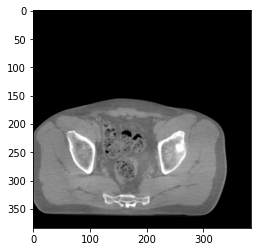

In [23]:
plt.imshow(x.squeeze(), 'gray'),

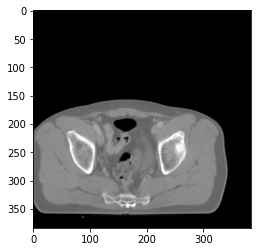

In [24]:
plt.imshow(y.squeeze(), 'gray')

In [25]:
x.shape, y.shape

((1, 384, 384), (1, 384, 384))

# training

In [26]:
import wandb

wandb.init(project="cbct_edge", config={
    "data": {
        "batchsize": BATCH,
    },
    "epochs": EPOCH,
    "model": {
        "in_channels": GEN_IN_CHANNELS,
        "out_channels": GEN_N_CLASSES,
        "optimizer": GEN_OPTIM_NAME,
        "init_lr": GEN_init_lr,
        "momentum": GEN_momentum,
        "encoder": ENCODER,
        "encoder_weight": ENCODER_WEIGHT,
        "activation": GEN_ACT,
        "decoder_attention_type": DECODER_ATT
    },
    "discriminator": {
        "in_channels": DIS_IN_CHANNELS,
        "out_channels": DIS_N_CLASSES,
        "optimizer": DIS_OPTIM_NAME,
        "init_lr": DIS_init_lr,
        "momentum": DIS_momentum,
        "encoder": "resnet152"
    }
})

wandb: Currently logged in as: junjun (use `wandb login --relogin` to force relogin)


In [27]:
trainloader = torch.utils.data.DataLoader(trainset, batch_size=BATCH, shuffle=True, num_workers=8)
testloader = torch.utils.data.DataLoader(testset, batch_size=BATCH, shuffle=False, num_workers=4)

In [28]:
import segmentation_models_pytorch as smp
import torchvision.models as models

model = smp.Unet(encoder_name=ENCODER, encoder_weights=ENCODER_WEIGHT, in_channels=GEN_IN_CHANNELS, classes=GEN_N_CLASSES)

In [29]:
discriminator = Model(in_channel=DIS_IN_CHANNELS, n_classes=DIS_N_CLASSES, activation=DIS_ACT)

In [30]:
models.resnet34()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [31]:
from codes.optimizer import Optimizer
# optimizer = optim.SGD(model.parameters(), lr=init_lr, momentum=momentum)
gen_optimizer = Optimizer(model.parameters(), name=GEN_OPTIM_NAME, lr=GEN_init_lr)
dis_optimizer = Optimizer(discriminator.parameters(), name=DIS_OPTIM_NAME, lr=DIS_init_lr)

In [32]:
wandb.watch(model)
wandb.watch(discriminator)

max_score = 0

for epoch in range(EPOCH):
        
        loss_gen, loss_dis = train_a2b_epoch(model, gen_optimizer, discriminator, dis_optimizer, trainloader, device)
        score_acc_train = eval_epoch(model, discriminator, trainloader, device)
        score_acc_test = eval_epoch(model, discriminator, testloader, device)

        
        wandb.log({
            "loss gen": loss_gen,
            "loss dis": loss_dis,
            "trainset acc score": score_acc_train,
            "testset acc score": score_acc_test
        })
        
        
        if score_acc_test  >  max_score:
            max_score = score_acc_test
            checkpoint = {
                "model": model.state_dict(),
                "optimizer": gen_optimizer.state_dict(),
                "dicriminator": discriminator.state_dict(),
                "dis_optim": dis_optimizer.state_dict()
            }
            torch.save(checkpoint, os.path.join("weight-edge", "{}.pth".format(wandb.run.name)))

84it [01:07,  1.25it/s]
84it [00:40,  2.07it/s]
12it [00:05,  2.21it/s]
84it [01:05,  1.28it/s]
84it [00:40,  2.08it/s]
12it [00:05,  2.19it/s]
84it [01:06,  1.27it/s]
84it [00:40,  2.10it/s]
12it [00:05,  2.19it/s]
84it [01:07,  1.25it/s]
84it [00:41,  2.05it/s]
12it [00:05,  2.18it/s]
84it [01:06,  1.27it/s]
84it [00:41,  2.05it/s]
12it [00:05,  2.19it/s]
84it [01:06,  1.26it/s]
84it [00:41,  2.01it/s]
12it [00:05,  2.19it/s]
84it [01:05,  1.28it/s]
84it [00:40,  2.08it/s]
12it [00:05,  2.15it/s]
84it [01:07,  1.24it/s]
84it [00:40,  2.06it/s]
12it [00:05,  2.17it/s]
84it [01:11,  1.17it/s]
84it [00:41,  2.04it/s]
12it [00:05,  2.19it/s]
84it [01:06,  1.27it/s]
84it [00:46,  1.82it/s]
12it [00:07,  1.60it/s]
84it [01:06,  1.26it/s]
84it [00:40,  2.08it/s]
12it [00:05,  2.19it/s]
84it [01:06,  1.27it/s]
84it [00:51,  1.64it/s]
12it [00:05,  2.19it/s]
84it [01:05,  1.28it/s]
84it [00:40,  2.07it/s]
12it [00:05,  2.19it/s]
84it [01:19,  1.06it/s]
84it [00:57,  1.47it/s]
12it [00:07,  1.

In [33]:
checkpoint = torch.load(os.path.join("weight-edge", "{}.pth".format(wandb.run.name)))

In [34]:
model = smp.Unet(encoder_name=ENCODER, encoder_weights=ENCODER_WEIGHT, in_channels=GEN_IN_CHANNELS, classes=GEN_N_CLASSES)

In [35]:
dir_path = os.path.join("eval-edge", wandb.run.name)
try:
    os.mkdir(dir_path)
except FileExistsError:
    pass

0it [00:00, ?it/s]

edge of ct_pred = 0.5003435611724854, edge of ct_true = 0.5000467896461487
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0078, device='cuda:0') tensor(1., device='cuda:0')


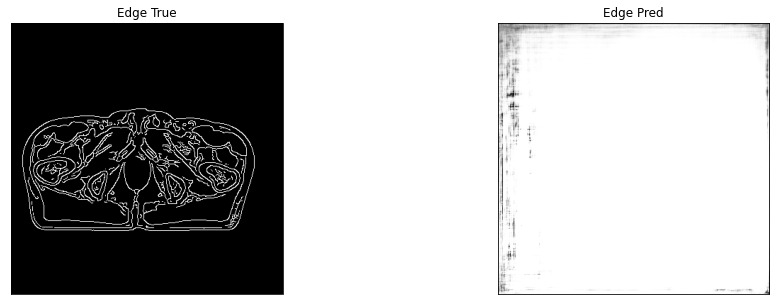

edge of ct_pred = 0.5003215670585632, edge of ct_true = 0.5000473260879517
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0208, device='cuda:0') tensor(1., device='cuda:0')


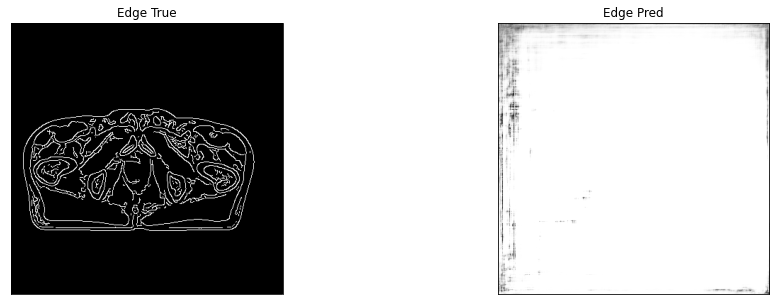

edge of ct_pred = 0.5003265142440796, edge of ct_true = 0.5000435709953308
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0103, device='cuda:0') tensor(1., device='cuda:0')


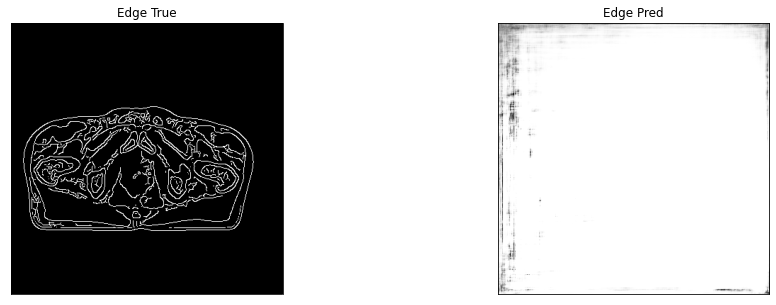

edge of ct_pred = 0.5003617405891418, edge of ct_true = 0.500048041343689
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0378, device='cuda:0') tensor(1., device='cuda:0')


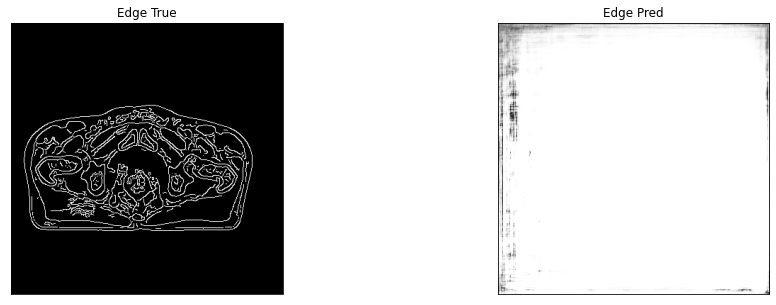

edge of ct_pred = 0.500363826751709, edge of ct_true = 0.5000483393669128
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0150, device='cuda:0') tensor(1., device='cuda:0')


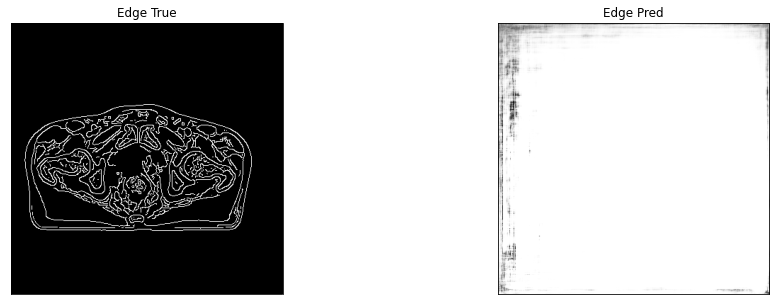

edge of ct_pred = 0.5003214478492737, edge of ct_true = 0.500052809715271
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0165, device='cuda:0') tensor(1., device='cuda:0')


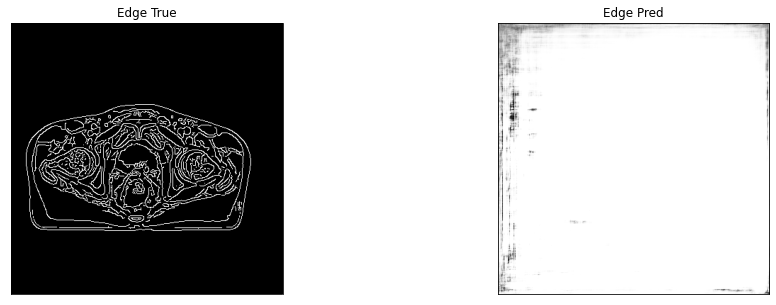

edge of ct_pred = 0.5003277063369751, edge of ct_true = 0.5000567436218262
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0102, device='cuda:0') tensor(1., device='cuda:0')


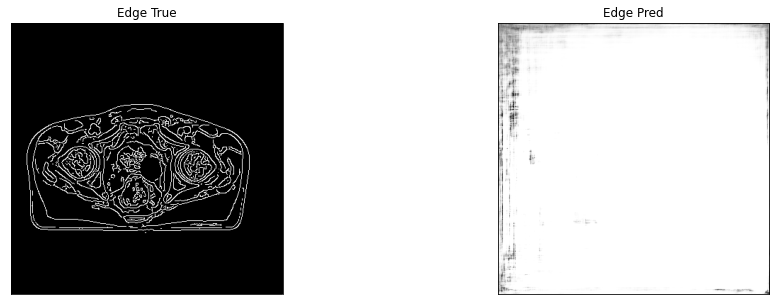

edge of ct_pred = 0.5003514289855957, edge of ct_true = 0.5000552535057068
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0061, device='cuda:0') tensor(1., device='cuda:0')


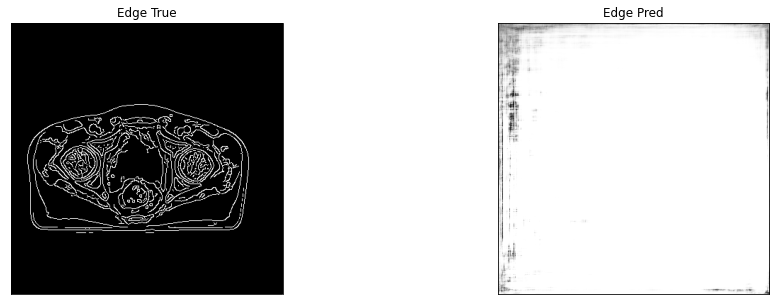

edge of ct_pred = 0.5003042221069336, edge of ct_true = 0.5000573396682739
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0170, device='cuda:0') tensor(1., device='cuda:0')


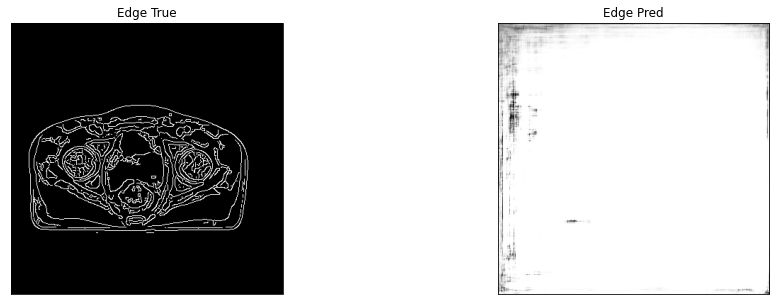

edge of ct_pred = 0.5003045201301575, edge of ct_true = 0.5000537037849426
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0185, device='cuda:0') tensor(1., device='cuda:0')


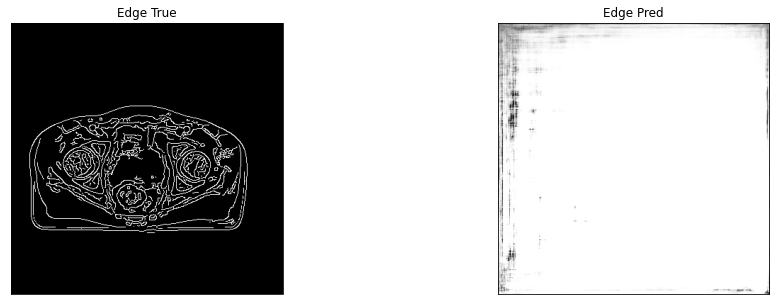

edge of ct_pred = 0.5003494024276733, edge of ct_true = 0.5000487565994263
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0508, device='cuda:0') tensor(1., device='cuda:0')


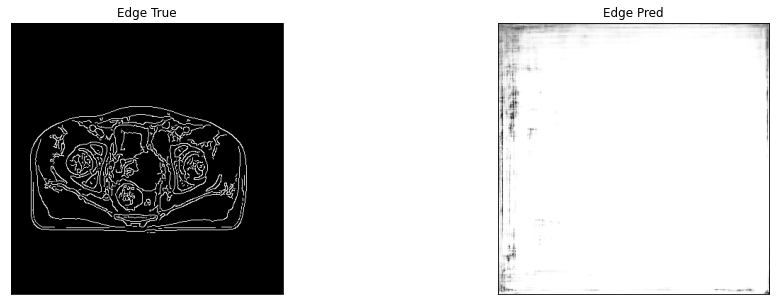

edge of ct_pred = 0.5003358721733093, edge of ct_true = 0.5000458359718323
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0225, device='cuda:0') tensor(1., device='cuda:0')


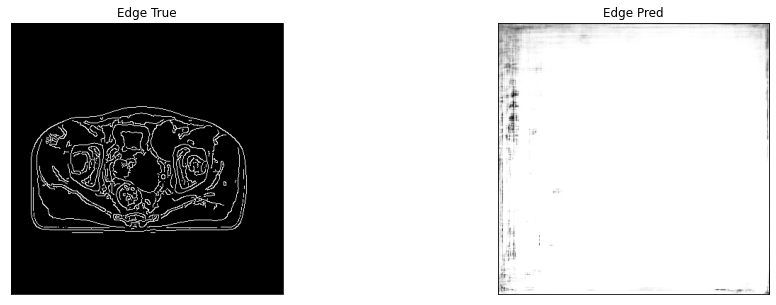

edge of ct_pred = 0.500320315361023, edge of ct_true = 0.5000457167625427
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0563, device='cuda:0') tensor(1., device='cuda:0')


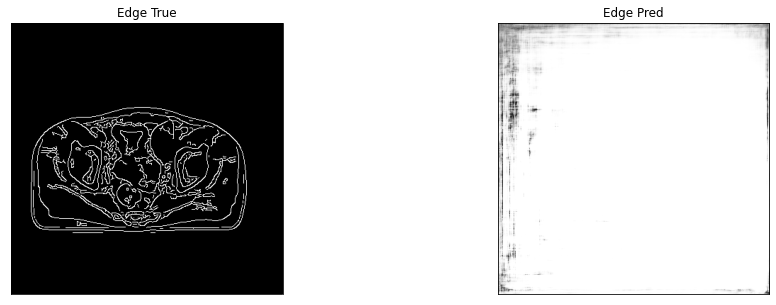

edge of ct_pred = 0.5003266930580139, edge of ct_true = 0.5000468492507935
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0130, device='cuda:0') tensor(1., device='cuda:0')


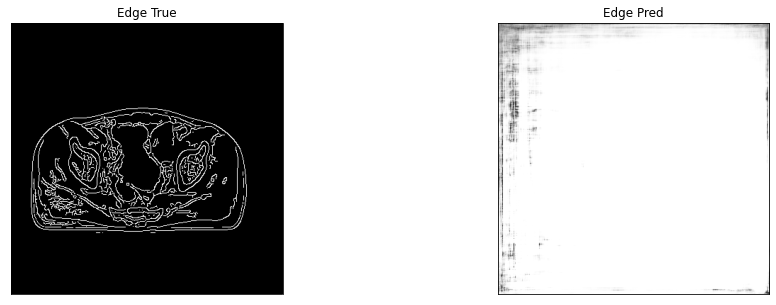

edge of ct_pred = 0.5002800226211548, edge of ct_true = 0.500049352645874
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0245, device='cuda:0') tensor(1., device='cuda:0')


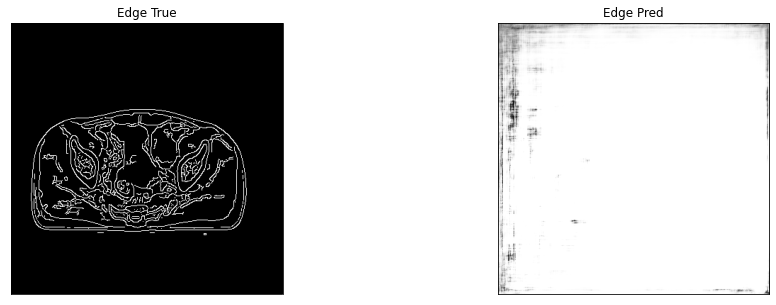

edge of ct_pred = 0.5003015398979187, edge of ct_true = 0.5000520944595337
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0419, device='cuda:0') tensor(1., device='cuda:0')


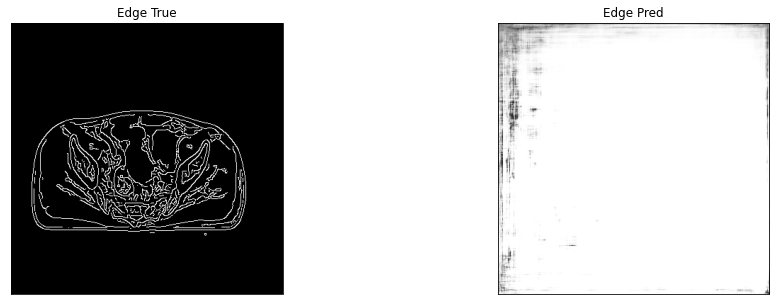

1it [00:03,  3.34s/it]

edge of ct_pred = 0.5003283023834229, edge of ct_true = 0.5000530481338501
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0433, device='cuda:0') tensor(1., device='cuda:0')


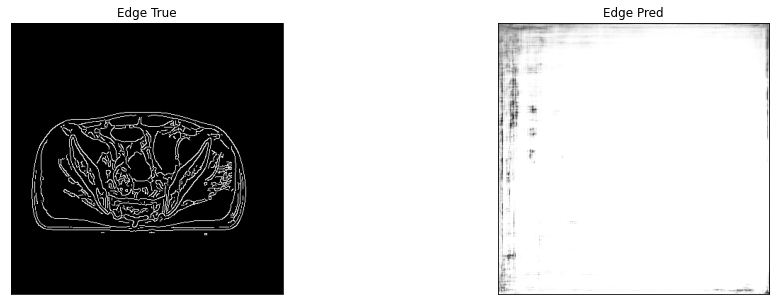

edge of ct_pred = 0.5003042817115784, edge of ct_true = 0.5000528693199158
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0180, device='cuda:0') tensor(1., device='cuda:0')


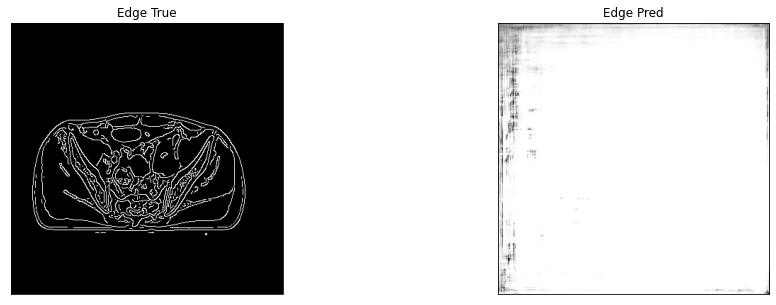

edge of ct_pred = 0.5003195405006409, edge of ct_true = 0.5000557899475098
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0255, device='cuda:0') tensor(1., device='cuda:0')


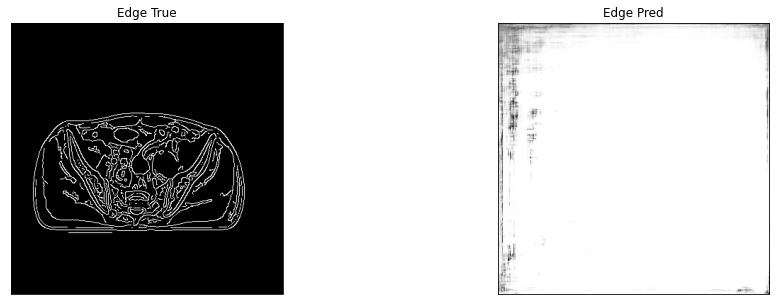

edge of ct_pred = 0.5003064870834351, edge of ct_true = 0.5000560283660889
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0316, device='cuda:0') tensor(1., device='cuda:0')


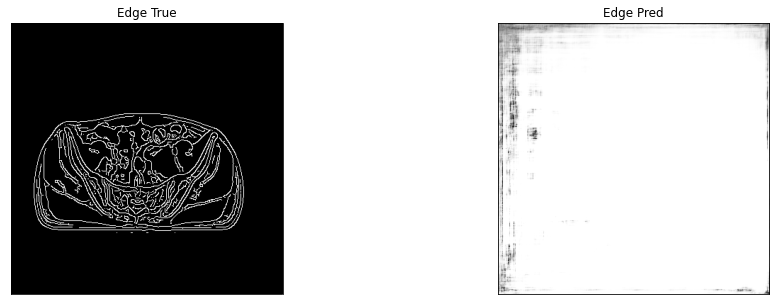

edge of ct_pred = 0.5003054141998291, edge of ct_true = 0.5000532865524292
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0776, device='cuda:0') tensor(1., device='cuda:0')


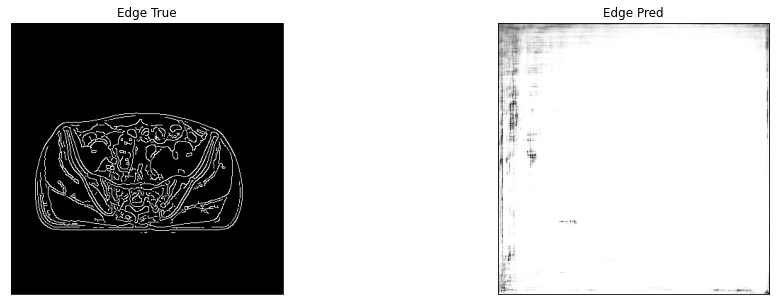

edge of ct_pred = 0.5003332495689392, edge of ct_true = 0.5000545978546143
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0600, device='cuda:0') tensor(1., device='cuda:0')


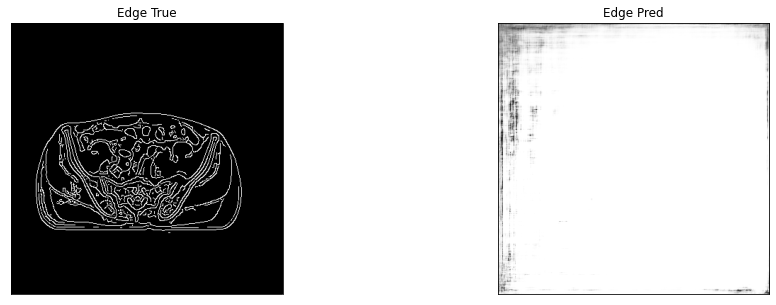

edge of ct_pred = 0.5003215074539185, edge of ct_true = 0.5000580549240112
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0486, device='cuda:0') tensor(1., device='cuda:0')


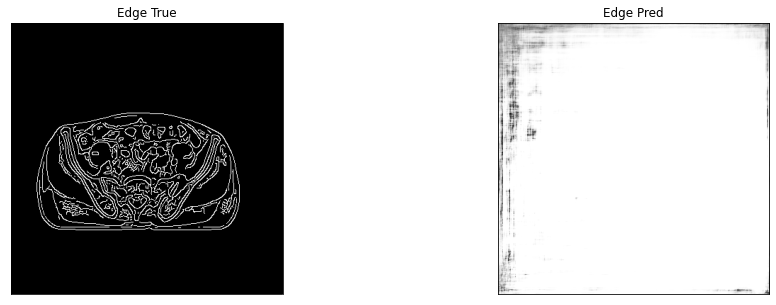

edge of ct_pred = 0.5003056526184082, edge of ct_true = 0.5000582337379456
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0557, device='cuda:0') tensor(1., device='cuda:0')


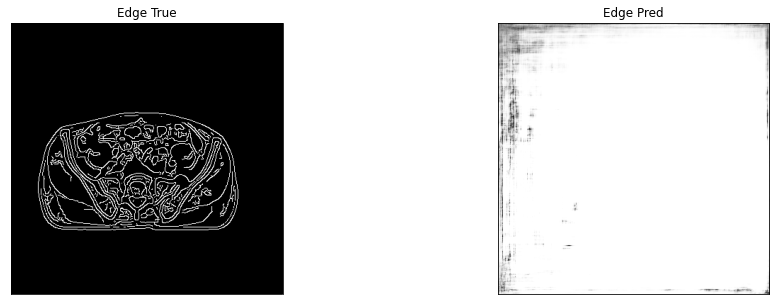

edge of ct_pred = 0.5003215074539185, edge of ct_true = 0.5000553131103516
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0308, device='cuda:0') tensor(1., device='cuda:0')


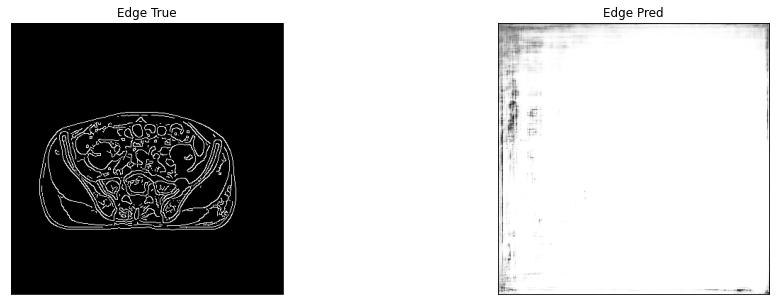

edge of ct_pred = 0.5003183484077454, edge of ct_true = 0.5000532269477844
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0785, device='cuda:0') tensor(1., device='cuda:0')


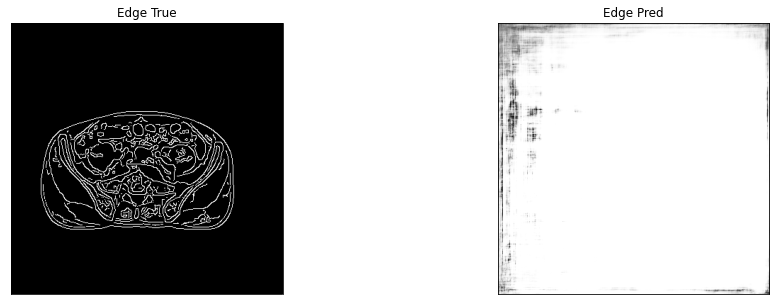

edge of ct_pred = 0.5003027319908142, edge of ct_true = 0.5000544190406799
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0238, device='cuda:0') tensor(1., device='cuda:0')


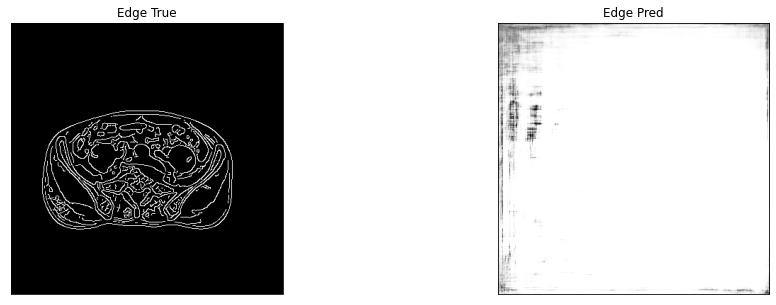

edge of ct_pred = 0.5002765655517578, edge of ct_true = 0.5000537633895874
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0182, device='cuda:0') tensor(1., device='cuda:0')


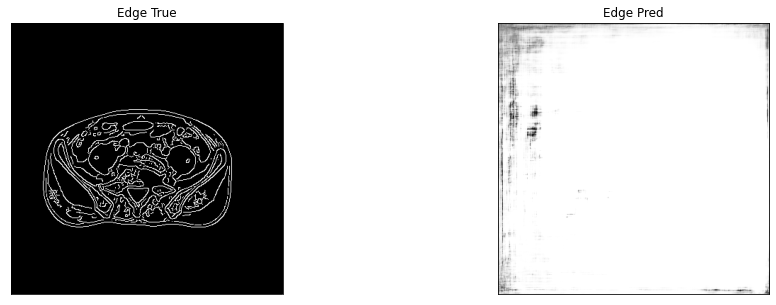

edge of ct_pred = 0.5003750324249268, edge of ct_true = 0.5000378489494324
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0135, device='cuda:0') tensor(1., device='cuda:0')


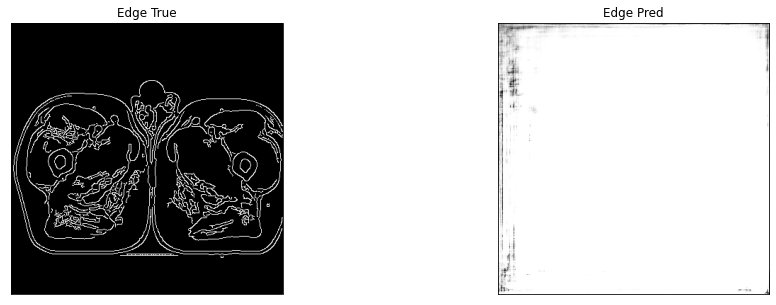

edge of ct_pred = 0.5003710389137268, edge of ct_true = 0.5000403523445129
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0148, device='cuda:0') tensor(1., device='cuda:0')


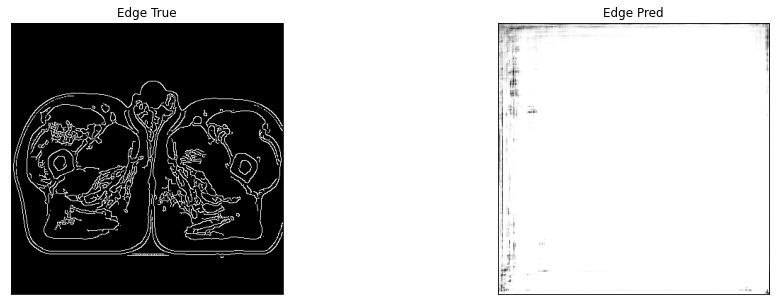

edge of ct_pred = 0.5003864765167236, edge of ct_true = 0.5000373721122742
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0011, device='cuda:0') tensor(1., device='cuda:0')


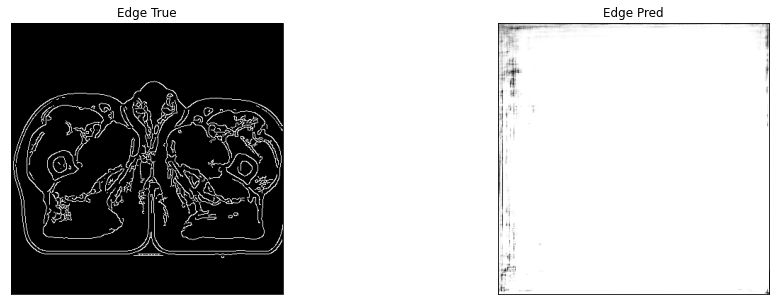

edge of ct_pred = 0.5003623366355896, edge of ct_true = 0.5000353455543518
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0105, device='cuda:0') tensor(1., device='cuda:0')


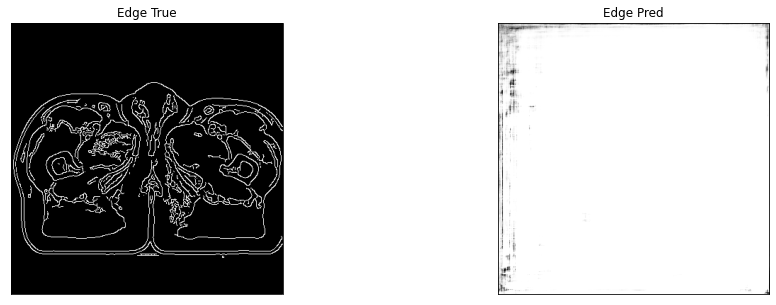

2it [00:05,  3.01s/it]

edge of ct_pred = 0.5003747940063477, edge of ct_true = 0.5000349283218384
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0074, device='cuda:0') tensor(1., device='cuda:0')


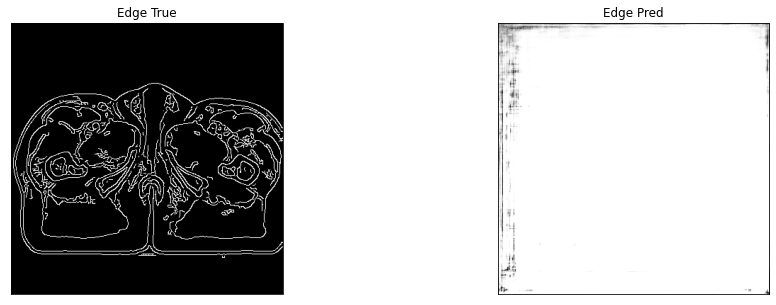

edge of ct_pred = 0.500385582447052, edge of ct_true = 0.5000383853912354
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0159, device='cuda:0') tensor(1., device='cuda:0')


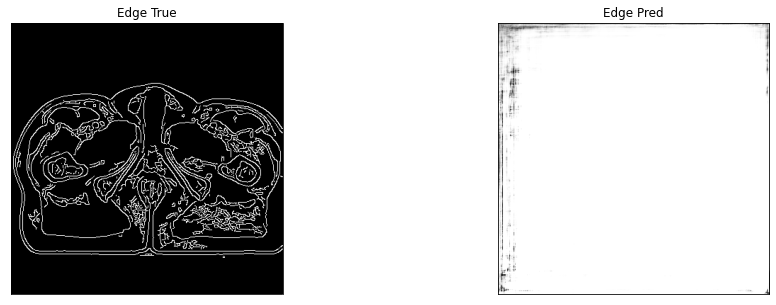

edge of ct_pred = 0.5003764033317566, edge of ct_true = 0.5000340342521667
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0044, device='cuda:0') tensor(1., device='cuda:0')


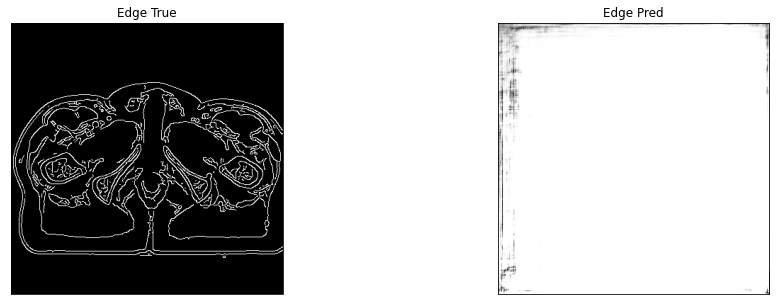

edge of ct_pred = 0.500357449054718, edge of ct_true = 0.5000376105308533
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0052, device='cuda:0') tensor(1., device='cuda:0')


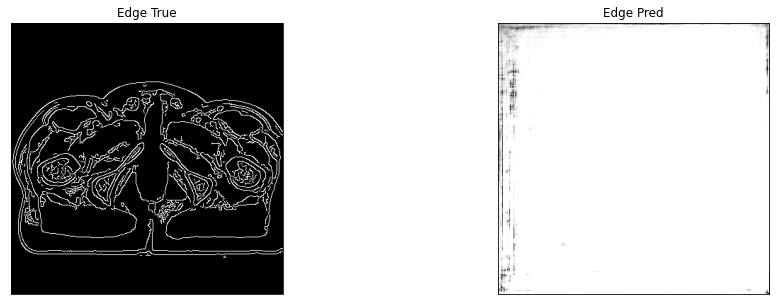

edge of ct_pred = 0.5003949999809265, edge of ct_true = 0.5000389218330383
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0009, device='cuda:0') tensor(1., device='cuda:0')


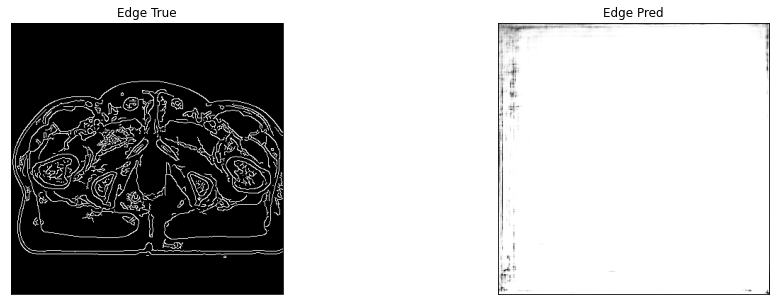

edge of ct_pred = 0.5003825426101685, edge of ct_true = 0.5000400543212891
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0042, device='cuda:0') tensor(1., device='cuda:0')


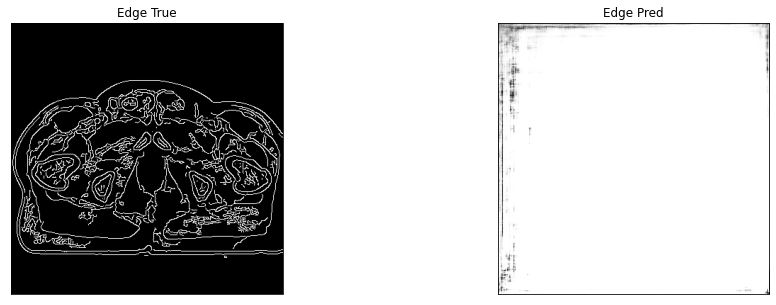

edge of ct_pred = 0.5003581047058105, edge of ct_true = 0.5000375509262085
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0024, device='cuda:0') tensor(1., device='cuda:0')


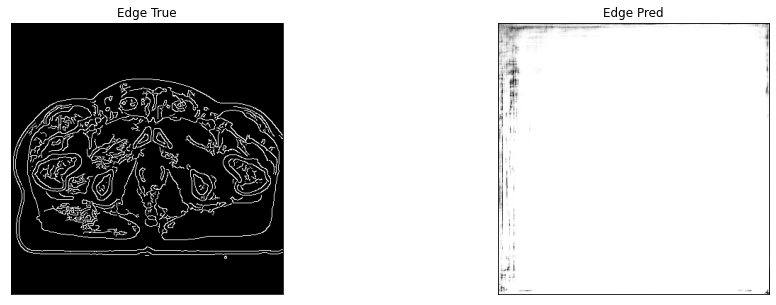

edge of ct_pred = 0.5003830194473267, edge of ct_true = 0.5000384449958801
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0142, device='cuda:0') tensor(1., device='cuda:0')


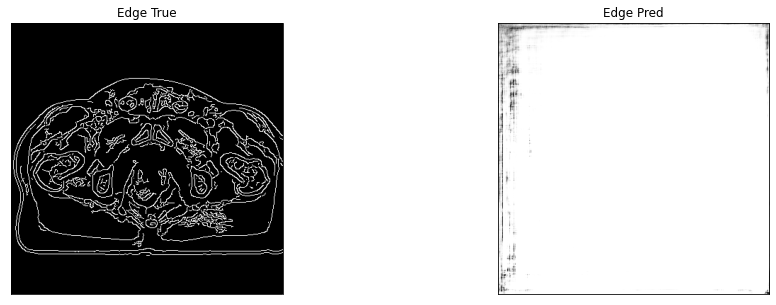

edge of ct_pred = 0.5003642439842224, edge of ct_true = 0.5000422596931458
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0069, device='cuda:0') tensor(1., device='cuda:0')


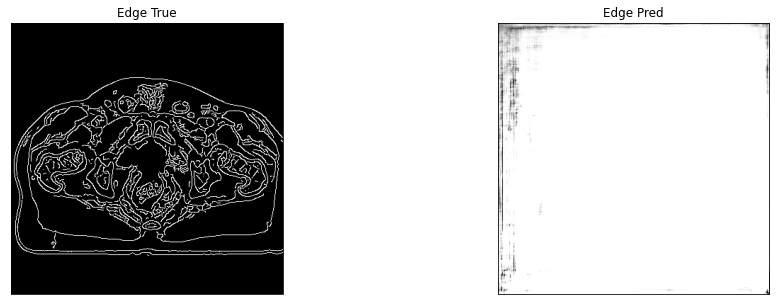

edge of ct_pred = 0.5003625750541687, edge of ct_true = 0.5000454187393188
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0075, device='cuda:0') tensor(1., device='cuda:0')


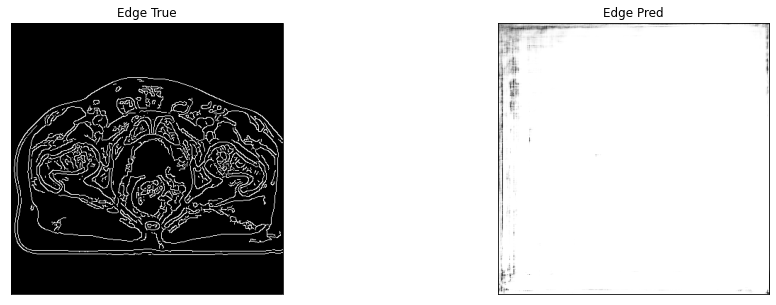

edge of ct_pred = 0.5003625750541687, edge of ct_true = 0.5000514388084412
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0042, device='cuda:0') tensor(1., device='cuda:0')


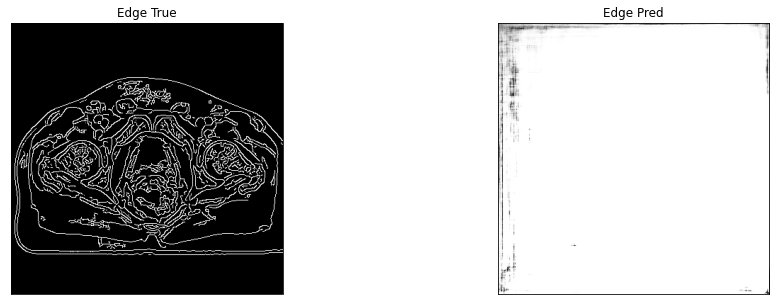

edge of ct_pred = 0.5003408193588257, edge of ct_true = 0.5000470876693726
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0025, device='cuda:0') tensor(1., device='cuda:0')


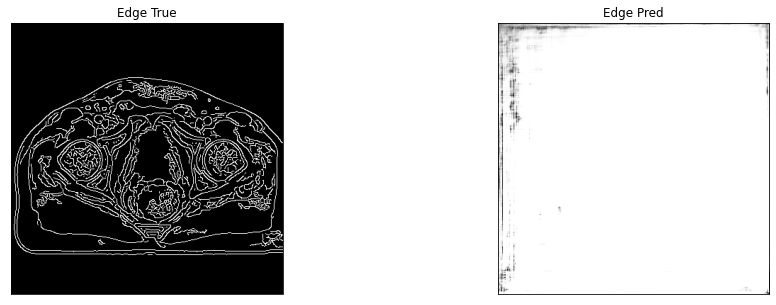

edge of ct_pred = 0.5003511905670166, edge of ct_true = 0.5000485181808472
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0050, device='cuda:0') tensor(1., device='cuda:0')


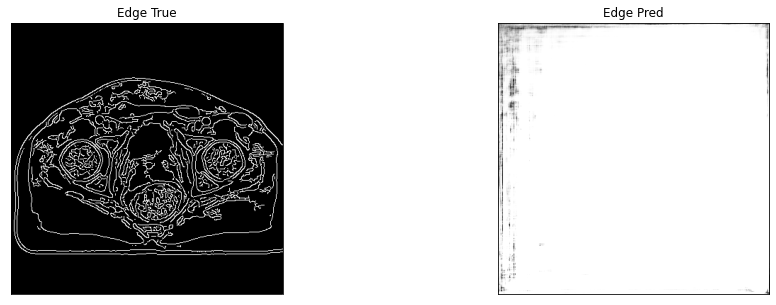

edge of ct_pred = 0.5003477931022644, edge of ct_true = 0.5000442862510681
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0053, device='cuda:0') tensor(1., device='cuda:0')


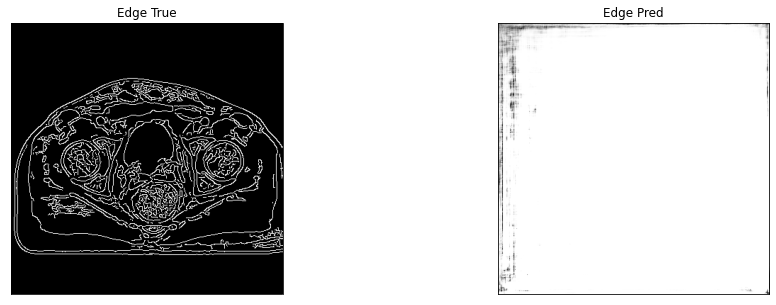

edge of ct_pred = 0.5003690719604492, edge of ct_true = 0.5000447034835815
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0049, device='cuda:0') tensor(1., device='cuda:0')


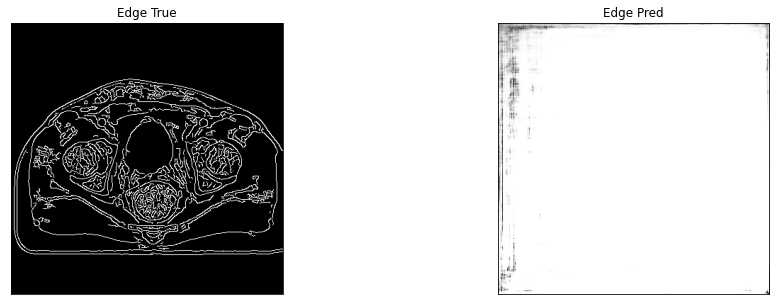

edge of ct_pred = 0.5003549456596375, edge of ct_true = 0.5000452399253845
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0065, device='cuda:0') tensor(1., device='cuda:0')


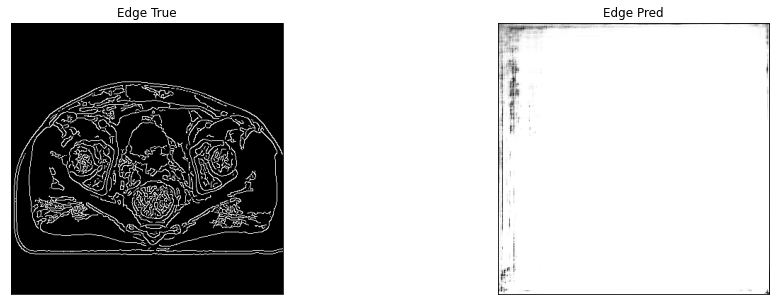

3it [00:07,  2.78s/it]

edge of ct_pred = 0.5003553032875061, edge of ct_true = 0.5000396370887756
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0060, device='cuda:0') tensor(1., device='cuda:0')


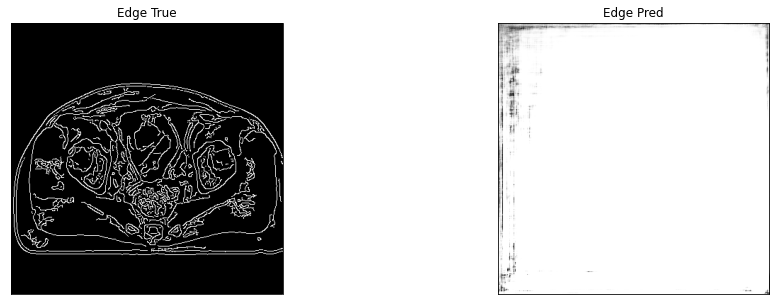

edge of ct_pred = 0.5003686547279358, edge of ct_true = 0.5000389218330383
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0025, device='cuda:0') tensor(1., device='cuda:0')


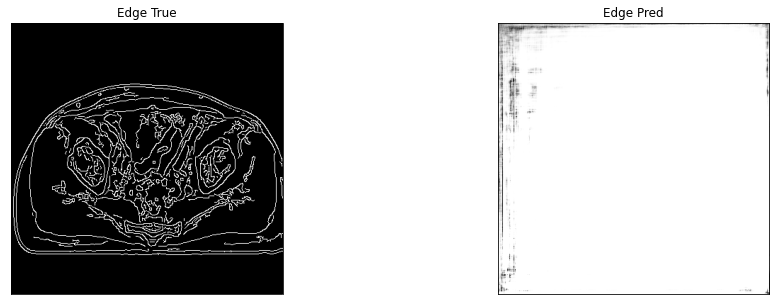

edge of ct_pred = 0.5003446936607361, edge of ct_true = 0.5000423192977905
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0096, device='cuda:0') tensor(1., device='cuda:0')


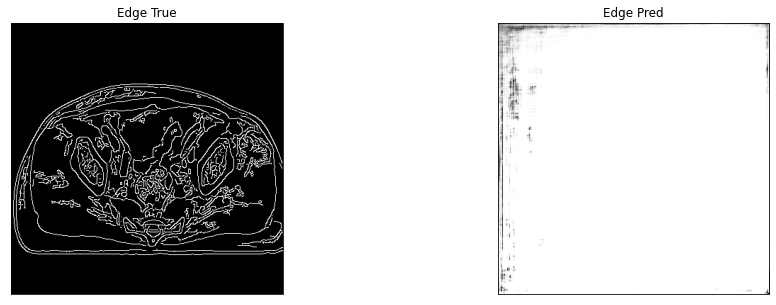

edge of ct_pred = 0.5003510117530823, edge of ct_true = 0.5000420808792114
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0142, device='cuda:0') tensor(1., device='cuda:0')


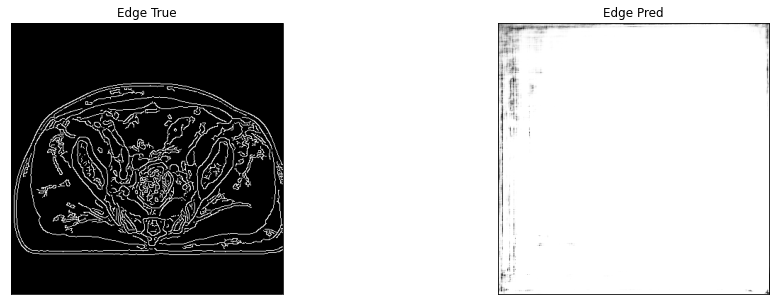

edge of ct_pred = 0.5003625750541687, edge of ct_true = 0.5000457763671875
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0047, device='cuda:0') tensor(1., device='cuda:0')


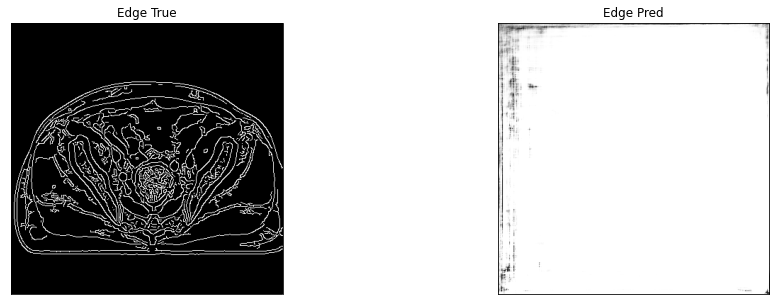

edge of ct_pred = 0.5003727078437805, edge of ct_true = 0.5000479221343994
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0099, device='cuda:0') tensor(1., device='cuda:0')


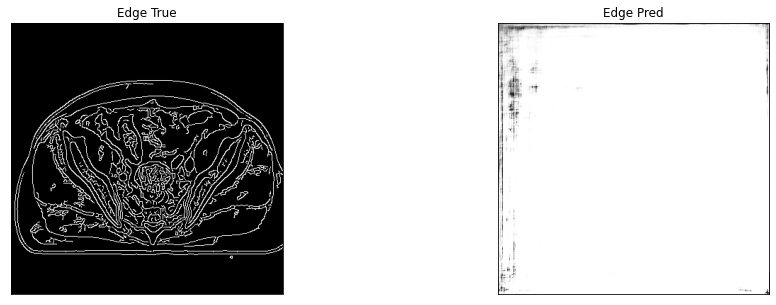

edge of ct_pred = 0.5003530383110046, edge of ct_true = 0.5000457167625427
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0176, device='cuda:0') tensor(1., device='cuda:0')


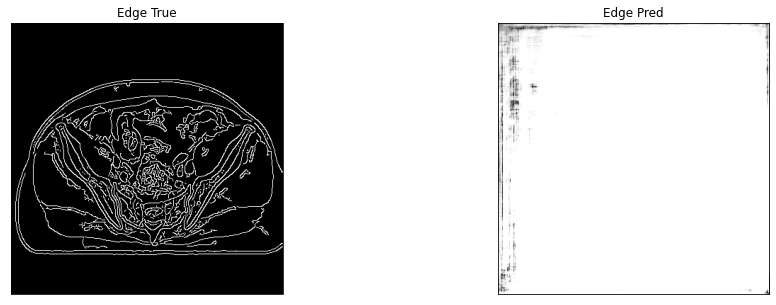

edge of ct_pred = 0.5003303289413452, edge of ct_true = 0.5000391602516174
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0340, device='cuda:0') tensor(1., device='cuda:0')


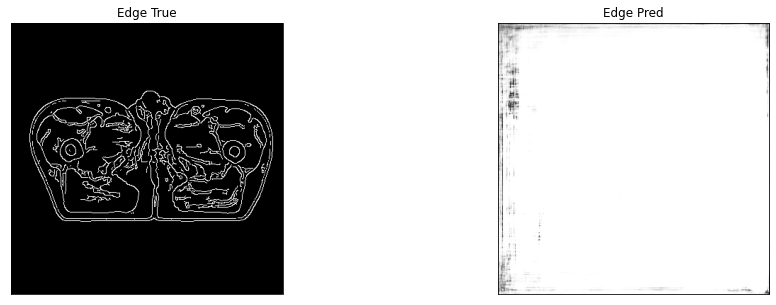

edge of ct_pred = 0.5003371238708496, edge of ct_true = 0.5000410676002502
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0268, device='cuda:0') tensor(1., device='cuda:0')


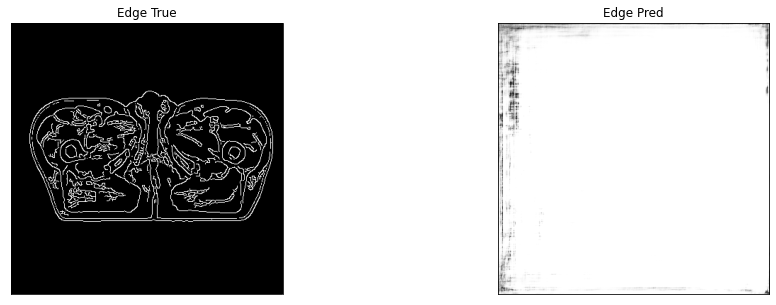

edge of ct_pred = 0.500328540802002, edge of ct_true = 0.5000391006469727
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0197, device='cuda:0') tensor(1., device='cuda:0')


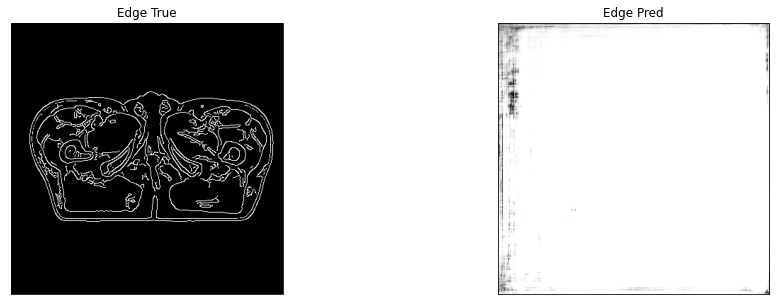

edge of ct_pred = 0.500339150428772, edge of ct_true = 0.5000432729721069
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0191, device='cuda:0') tensor(1., device='cuda:0')


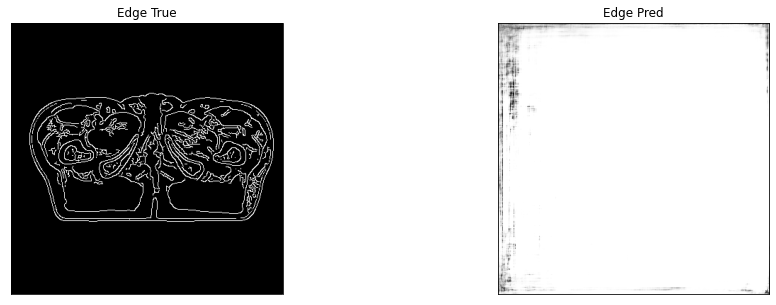

edge of ct_pred = 0.5003209114074707, edge of ct_true = 0.5000395178794861
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0314, device='cuda:0') tensor(1., device='cuda:0')


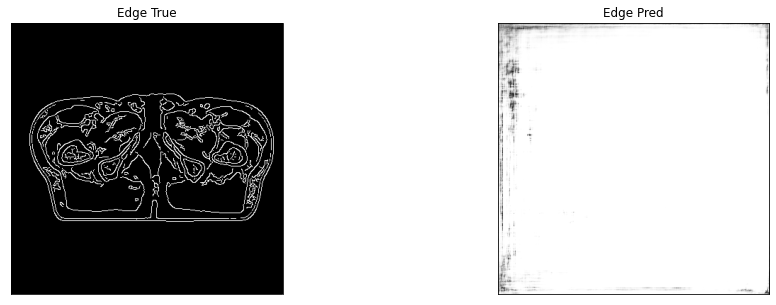

edge of ct_pred = 0.500333845615387, edge of ct_true = 0.5000399351119995
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0169, device='cuda:0') tensor(1., device='cuda:0')


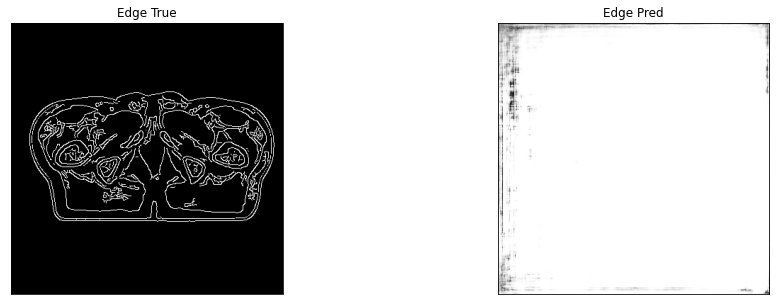

edge of ct_pred = 0.50034499168396, edge of ct_true = 0.5000425577163696
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0314, device='cuda:0') tensor(1., device='cuda:0')


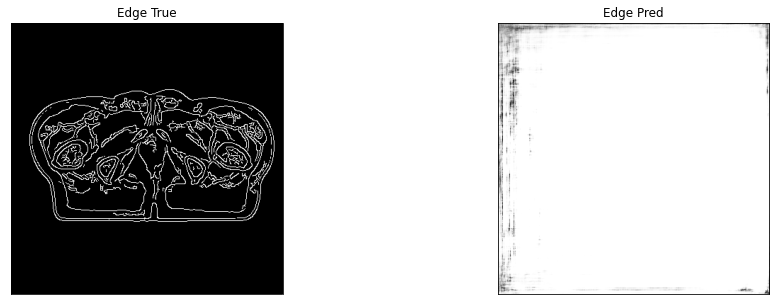

edge of ct_pred = 0.5003454685211182, edge of ct_true = 0.5000426769256592
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0109, device='cuda:0') tensor(1., device='cuda:0')


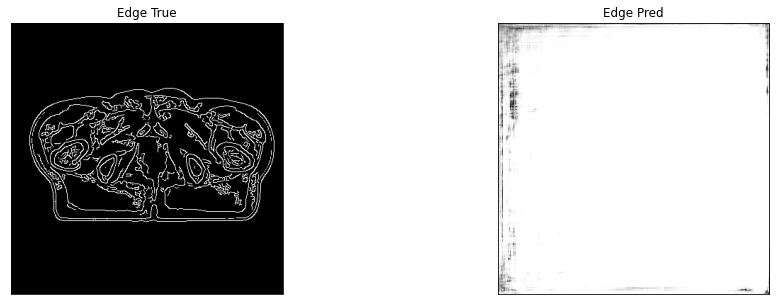

edge of ct_pred = 0.500336766242981, edge of ct_true = 0.5000435709953308
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0228, device='cuda:0') tensor(1., device='cuda:0')


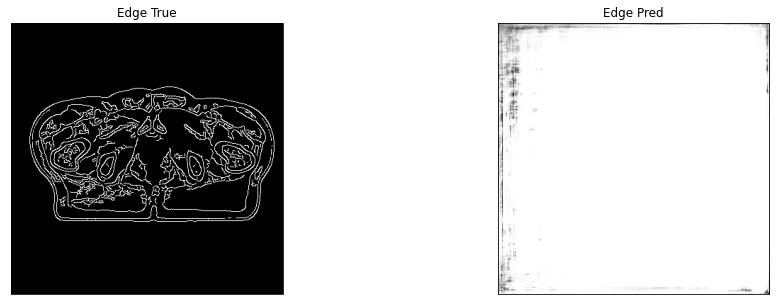

4it [00:10,  2.66s/it]

edge of ct_pred = 0.5003399848937988, edge of ct_true = 0.5000405311584473
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0115, device='cuda:0') tensor(1., device='cuda:0')


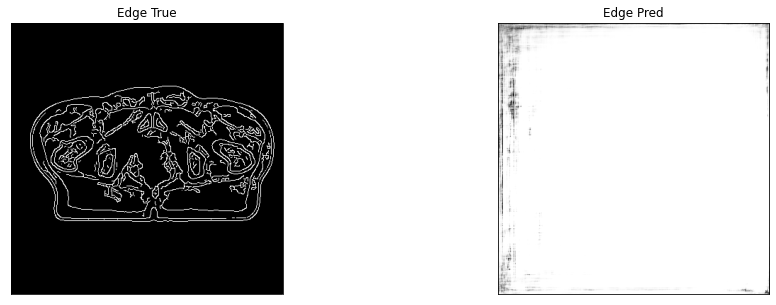

edge of ct_pred = 0.5003358721733093, edge of ct_true = 0.5000426769256592
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0280, device='cuda:0') tensor(1., device='cuda:0')


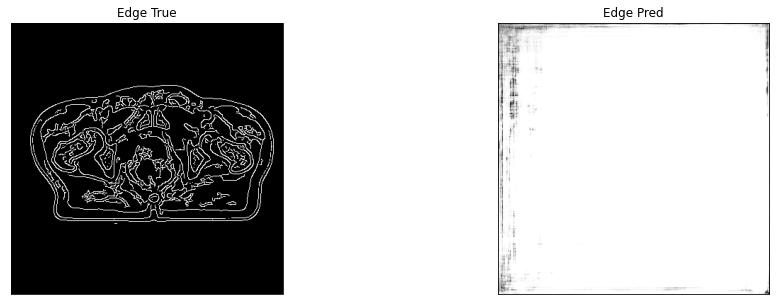

edge of ct_pred = 0.5003184676170349, edge of ct_true = 0.5000463128089905
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0116, device='cuda:0') tensor(1., device='cuda:0')


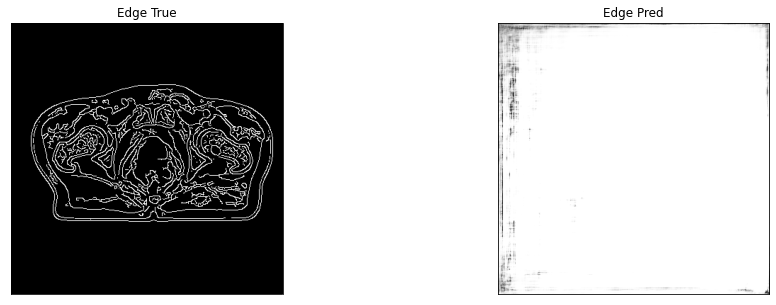

edge of ct_pred = 0.5003491640090942, edge of ct_true = 0.5000463128089905
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0358, device='cuda:0') tensor(1., device='cuda:0')


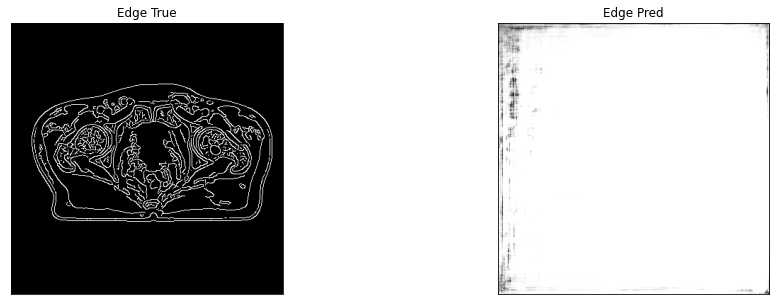

edge of ct_pred = 0.5003255605697632, edge of ct_true = 0.5000500679016113
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0253, device='cuda:0') tensor(1., device='cuda:0')


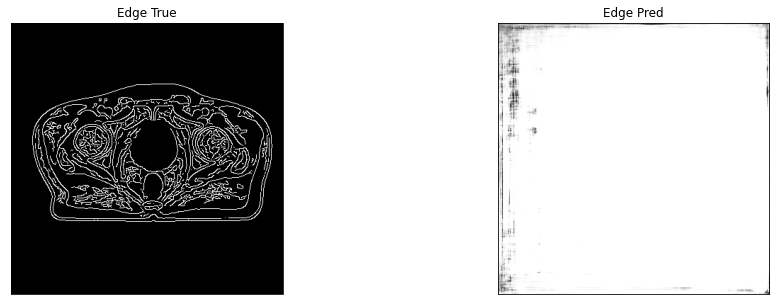

edge of ct_pred = 0.5003087520599365, edge of ct_true = 0.5000458359718323
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0169, device='cuda:0') tensor(1., device='cuda:0')


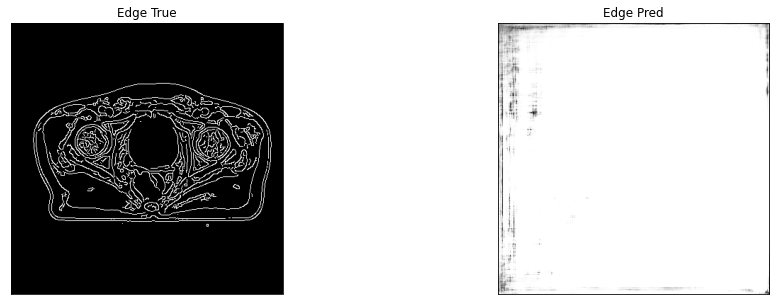

edge of ct_pred = 0.5003159642219543, edge of ct_true = 0.5000435709953308
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0290, device='cuda:0') tensor(1., device='cuda:0')


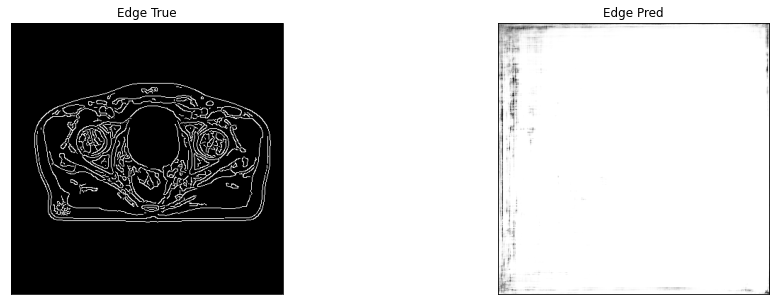

edge of ct_pred = 0.5003224015235901, edge of ct_true = 0.5000417232513428
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0363, device='cuda:0') tensor(1., device='cuda:0')


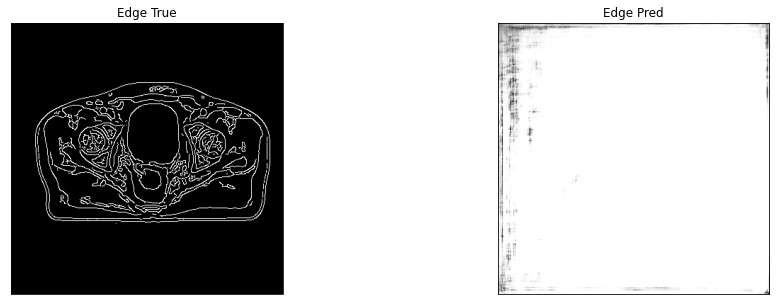

edge of ct_pred = 0.5003446340560913, edge of ct_true = 0.5000415444374084
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0350, device='cuda:0') tensor(1., device='cuda:0')


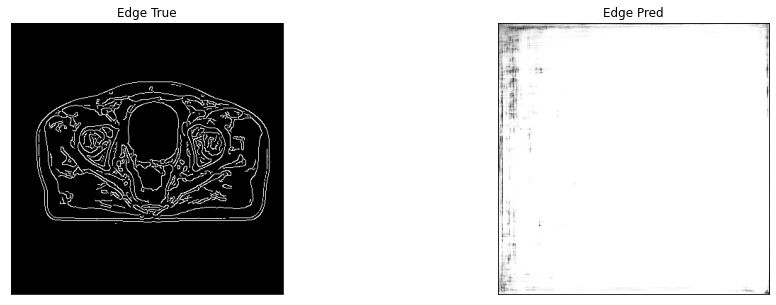

edge of ct_pred = 0.500333845615387, edge of ct_true = 0.5000432133674622
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0128, device='cuda:0') tensor(1., device='cuda:0')


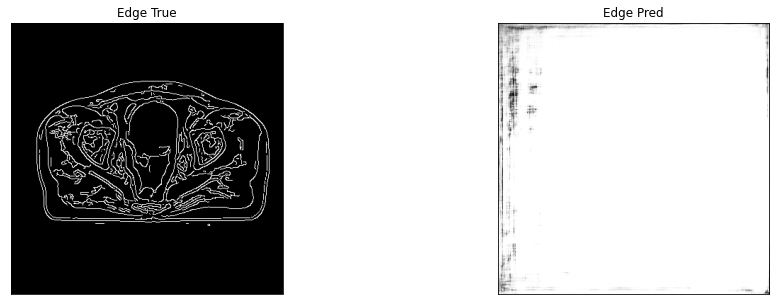

edge of ct_pred = 0.5003537535667419, edge of ct_true = 0.5000438094139099
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0239, device='cuda:0') tensor(1., device='cuda:0')


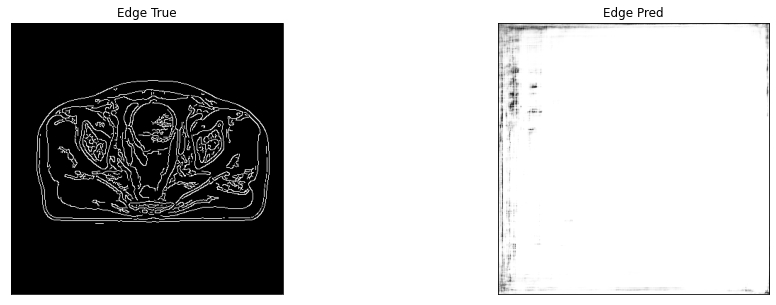

edge of ct_pred = 0.5003300905227661, edge of ct_true = 0.500044047832489
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0236, device='cuda:0') tensor(1., device='cuda:0')


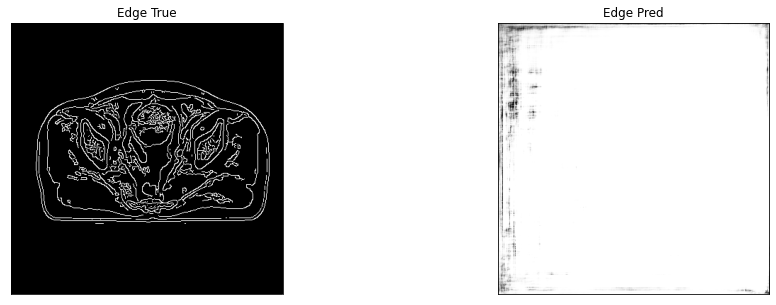

edge of ct_pred = 0.5003384947776794, edge of ct_true = 0.500043511390686
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0353, device='cuda:0') tensor(1., device='cuda:0')


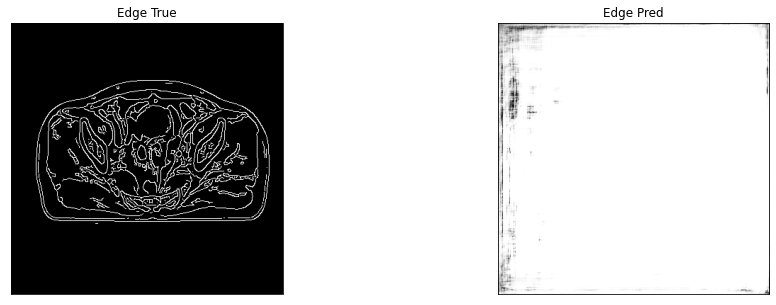

edge of ct_pred = 0.5003141164779663, edge of ct_true = 0.5000483393669128
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0288, device='cuda:0') tensor(1., device='cuda:0')


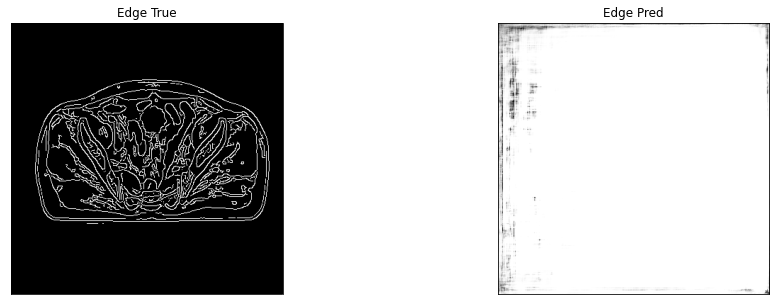

edge of ct_pred = 0.5003112554550171, edge of ct_true = 0.5000492334365845
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0093, device='cuda:0') tensor(1., device='cuda:0')


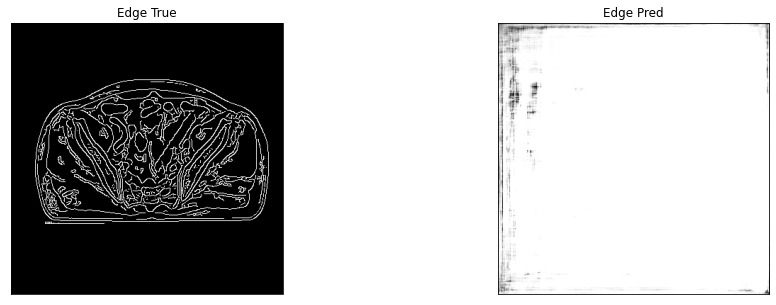

edge of ct_pred = 0.5003371238708496, edge of ct_true = 0.5000444054603577
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0491, device='cuda:0') tensor(1., device='cuda:0')


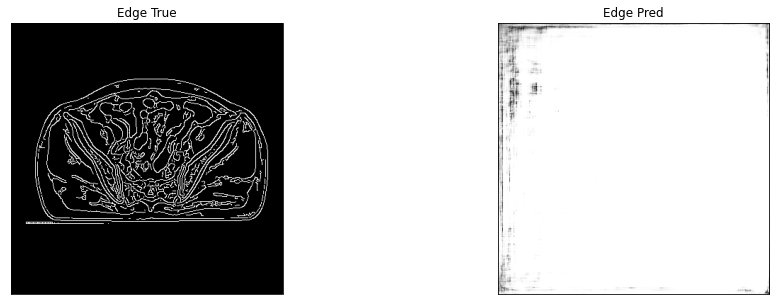

5it [00:12,  2.52s/it]

edge of ct_pred = 0.5003243684768677, edge of ct_true = 0.500047504901886
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0356, device='cuda:0') tensor(1., device='cuda:0')


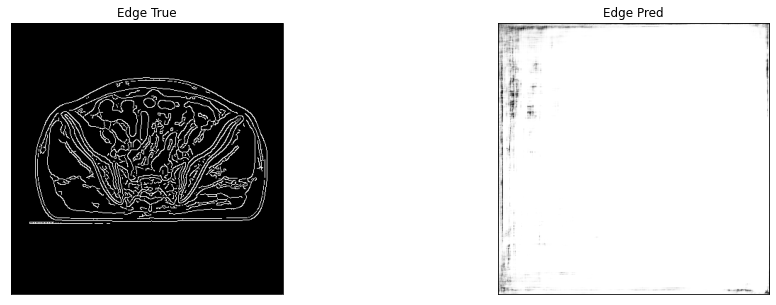

edge of ct_pred = 0.5003764629364014, edge of ct_true = 0.5000512599945068
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0014, device='cuda:0') tensor(1., device='cuda:0')


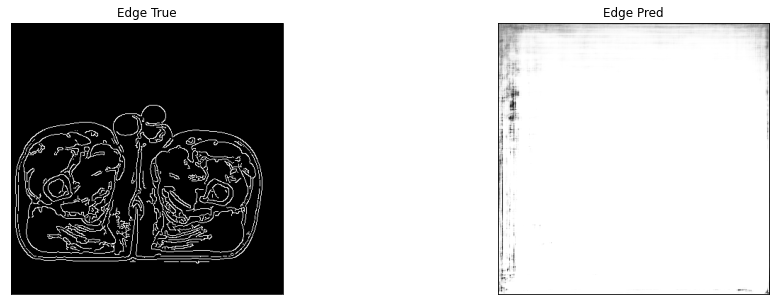

edge of ct_pred = 0.5003486275672913, edge of ct_true = 0.5000563263893127
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0088, device='cuda:0') tensor(1., device='cuda:0')


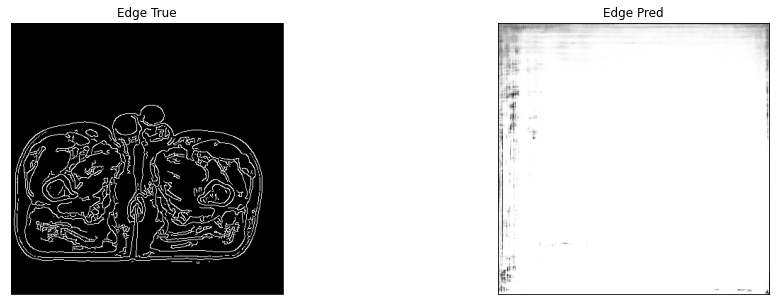

edge of ct_pred = 0.5004109740257263, edge of ct_true = 0.5000593662261963
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0021, device='cuda:0') tensor(1., device='cuda:0')


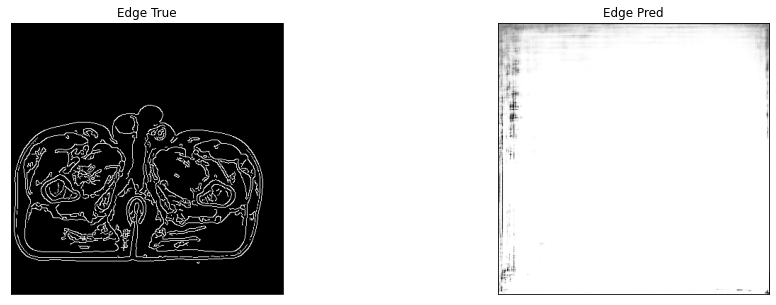

edge of ct_pred = 0.5003951191902161, edge of ct_true = 0.5000566840171814
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0179, device='cuda:0') tensor(1., device='cuda:0')


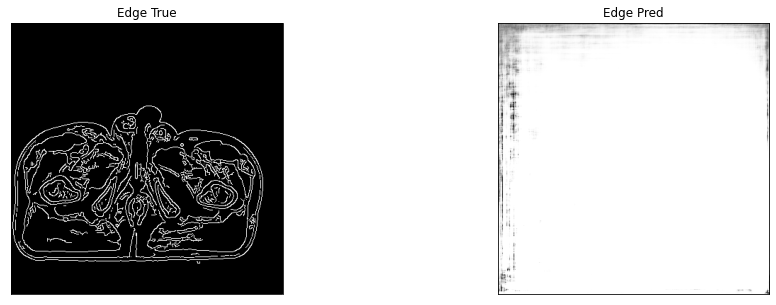

edge of ct_pred = 0.5003875494003296, edge of ct_true = 0.5000537633895874
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0082, device='cuda:0') tensor(1., device='cuda:0')


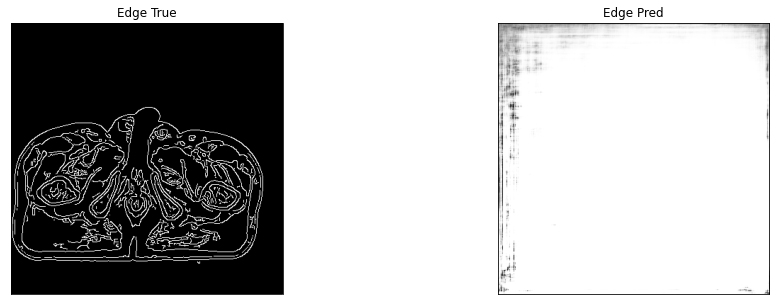

edge of ct_pred = 0.5003697872161865, edge of ct_true = 0.5000608563423157
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0030, device='cuda:0') tensor(1., device='cuda:0')


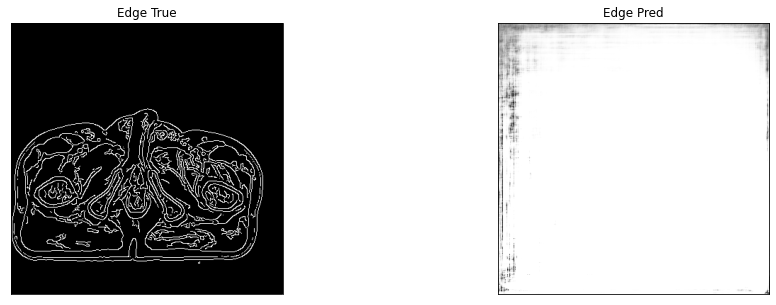

edge of ct_pred = 0.5003753900527954, edge of ct_true = 0.5000592470169067
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0008, device='cuda:0') tensor(1., device='cuda:0')


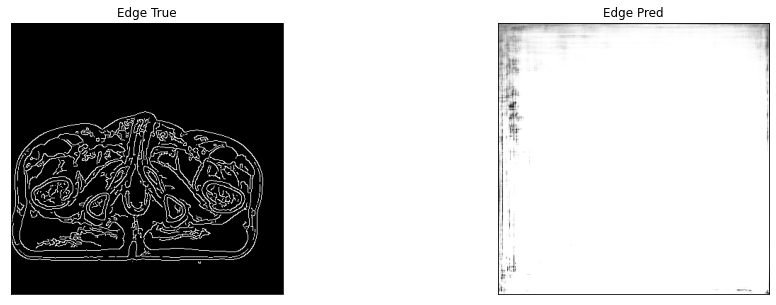

edge of ct_pred = 0.5003771185874939, edge of ct_true = 0.5000565052032471
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0083, device='cuda:0') tensor(1., device='cuda:0')


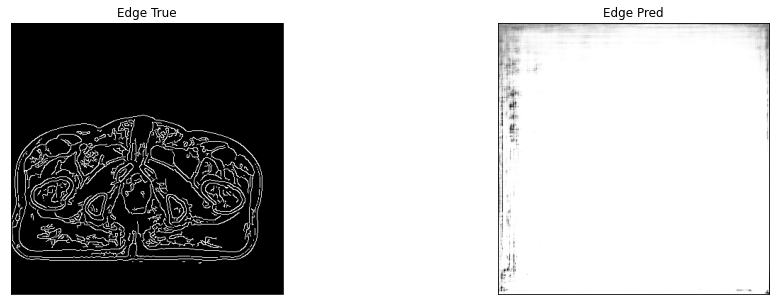

edge of ct_pred = 0.5003993511199951, edge of ct_true = 0.5000547170639038
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0050, device='cuda:0') tensor(1., device='cuda:0')


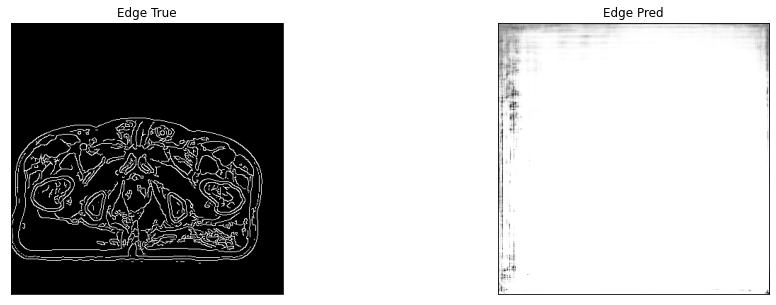

edge of ct_pred = 0.5003957748413086, edge of ct_true = 0.5000563859939575
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0064, device='cuda:0') tensor(1., device='cuda:0')


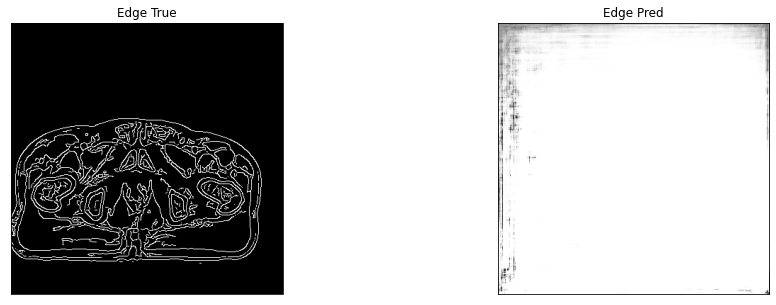

edge of ct_pred = 0.5003829002380371, edge of ct_true = 0.5000544190406799
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0024, device='cuda:0') tensor(1., device='cuda:0')


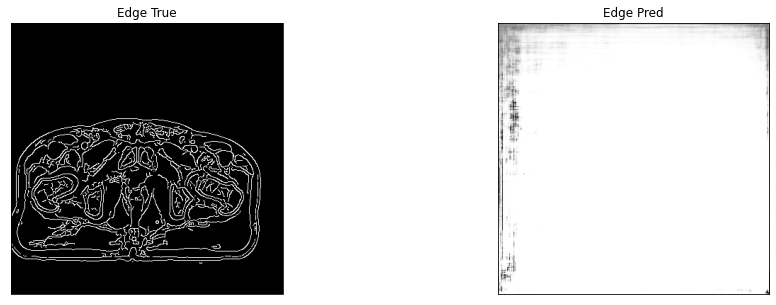

edge of ct_pred = 0.5003753304481506, edge of ct_true = 0.5000549554824829
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0107, device='cuda:0') tensor(1., device='cuda:0')


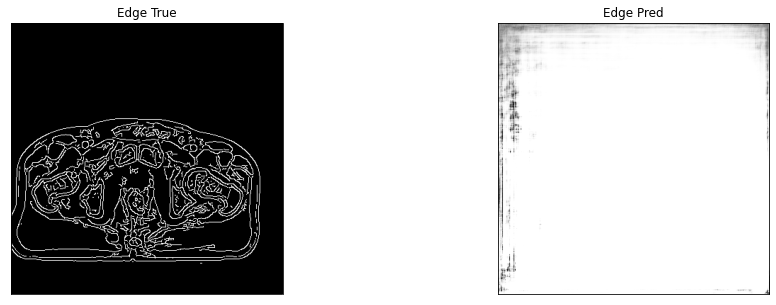

edge of ct_pred = 0.5003587007522583, edge of ct_true = 0.5000594854354858
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0080, device='cuda:0') tensor(1., device='cuda:0')


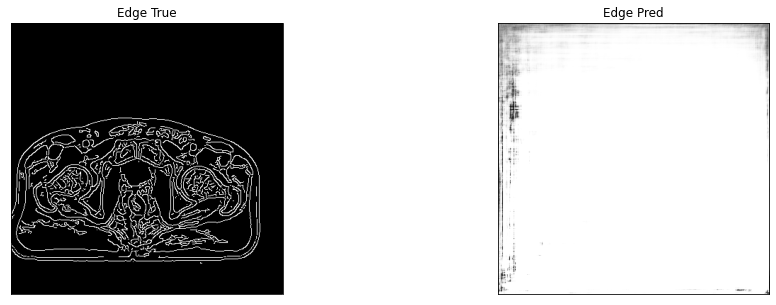

edge of ct_pred = 0.5003843903541565, edge of ct_true = 0.5000614523887634
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0059, device='cuda:0') tensor(1., device='cuda:0')


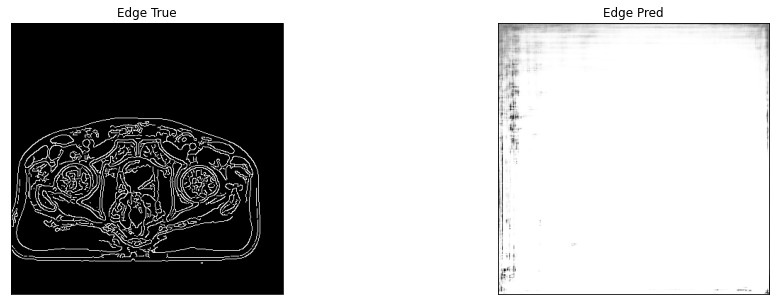

edge of ct_pred = 0.5003514289855957, edge of ct_true = 0.5000661611557007
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0159, device='cuda:0') tensor(1., device='cuda:0')


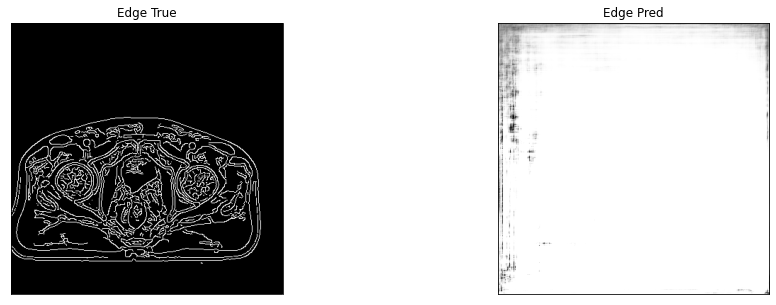

6it [00:14,  2.42s/it]

edge of ct_pred = 0.5003659725189209, edge of ct_true = 0.5000653266906738
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0030, device='cuda:0') tensor(1., device='cuda:0')


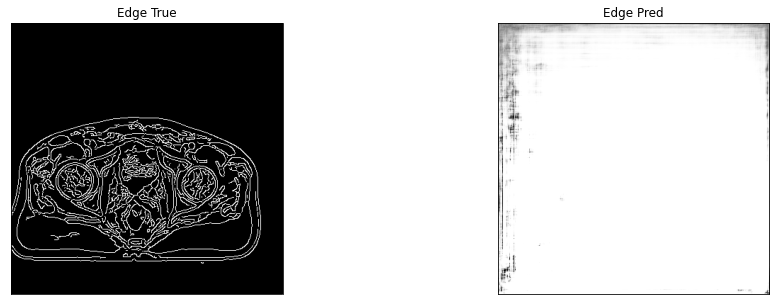

edge of ct_pred = 0.500389575958252, edge of ct_true = 0.50006103515625
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0022, device='cuda:0') tensor(1., device='cuda:0')


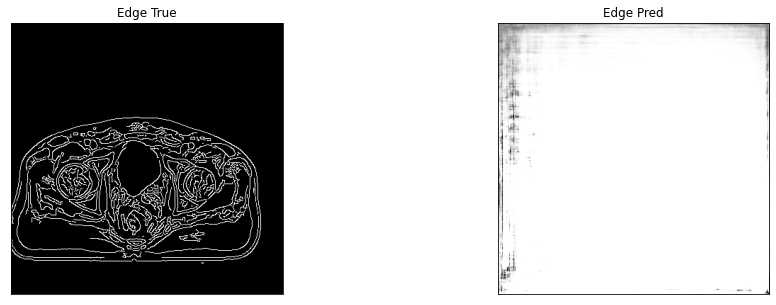

edge of ct_pred = 0.5003579258918762, edge of ct_true = 0.500058650970459
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0060, device='cuda:0') tensor(1., device='cuda:0')


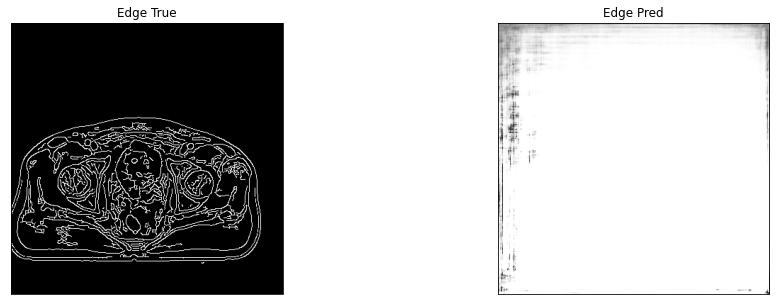

edge of ct_pred = 0.5003737807273865, edge of ct_true = 0.5000598430633545
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0028, device='cuda:0') tensor(1., device='cuda:0')


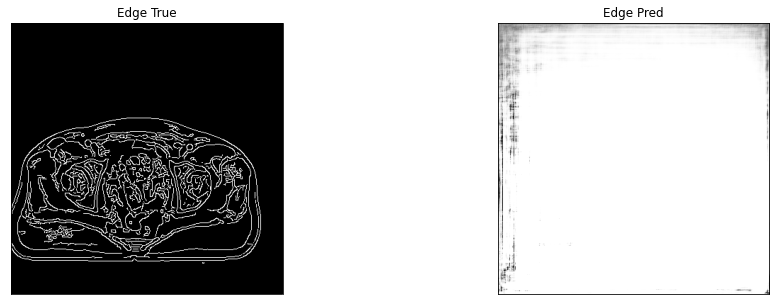

edge of ct_pred = 0.5003766417503357, edge of ct_true = 0.5000619292259216
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0069, device='cuda:0') tensor(1., device='cuda:0')


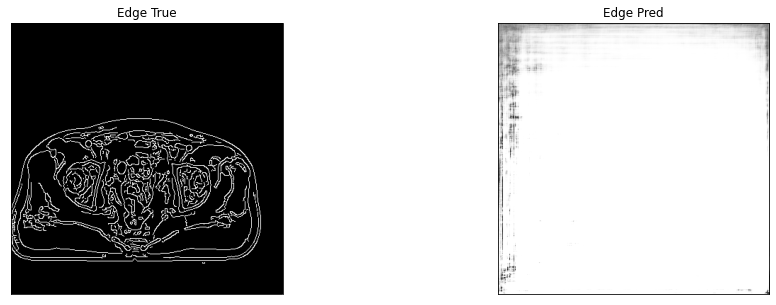

edge of ct_pred = 0.5003858804702759, edge of ct_true = 0.5000657439231873
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0040, device='cuda:0') tensor(1., device='cuda:0')


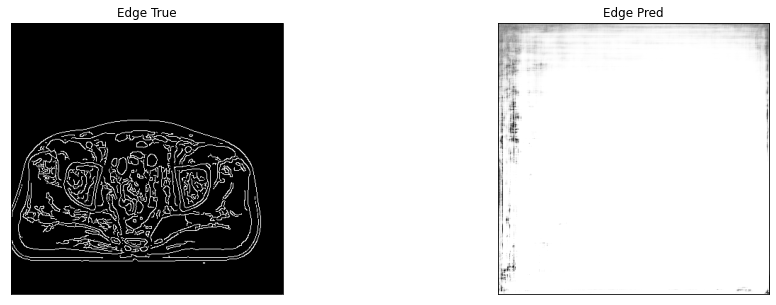

edge of ct_pred = 0.5003745555877686, edge of ct_true = 0.5000631213188171
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0013, device='cuda:0') tensor(1., device='cuda:0')


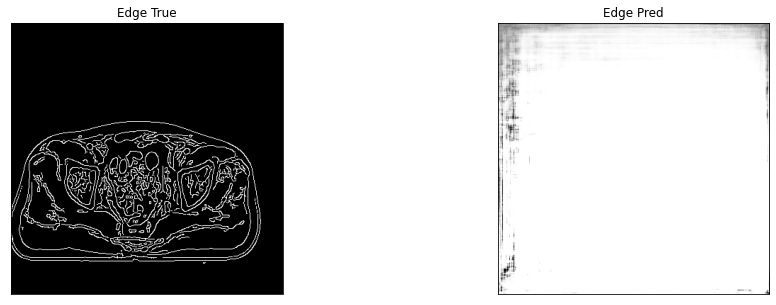

edge of ct_pred = 0.500369668006897, edge of ct_true = 0.5000664591789246
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0125, device='cuda:0') tensor(1., device='cuda:0')


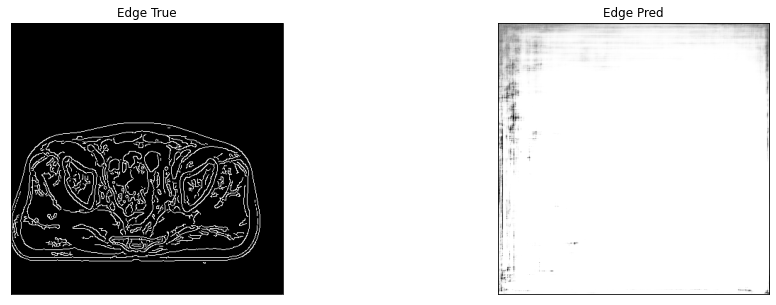

edge of ct_pred = 0.500372052192688, edge of ct_true = 0.5000719428062439
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0010, device='cuda:0') tensor(1., device='cuda:0')


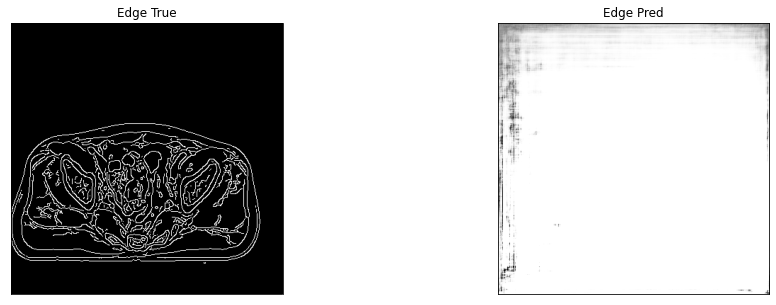

edge of ct_pred = 0.5003678798675537, edge of ct_true = 0.5000720620155334
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0163, device='cuda:0') tensor(1., device='cuda:0')


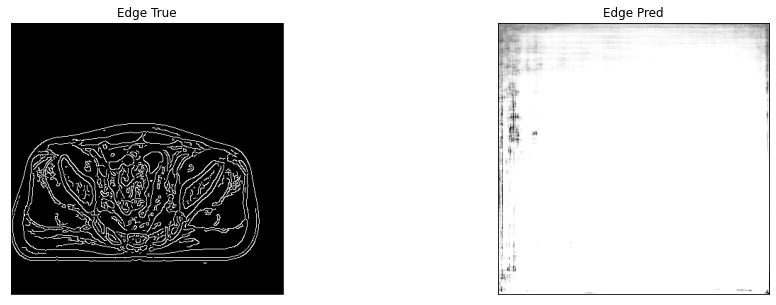

edge of ct_pred = 0.5003659725189209, edge of ct_true = 0.5000788569450378
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0052, device='cuda:0') tensor(1., device='cuda:0')


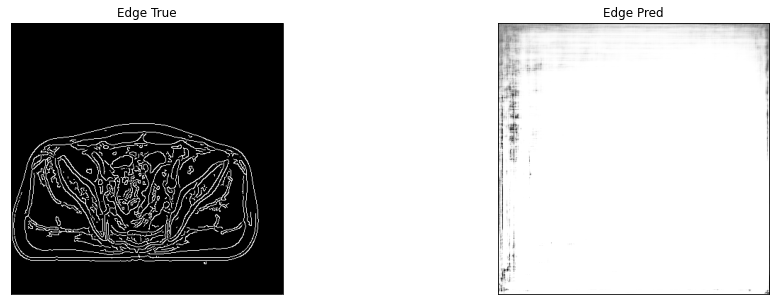

edge of ct_pred = 0.5003930330276489, edge of ct_true = 0.5000846982002258
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0015, device='cuda:0') tensor(1., device='cuda:0')


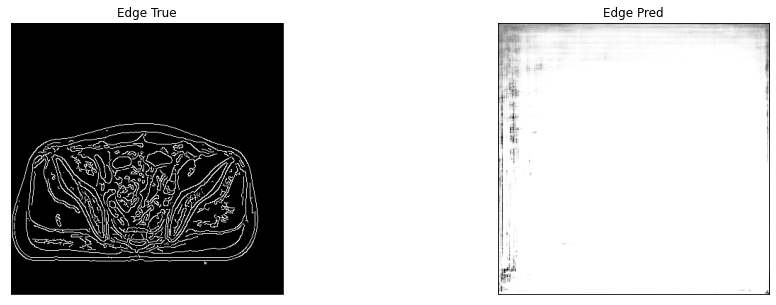

edge of ct_pred = 0.5003811120986938, edge of ct_true = 0.5000825524330139
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0142, device='cuda:0') tensor(1., device='cuda:0')


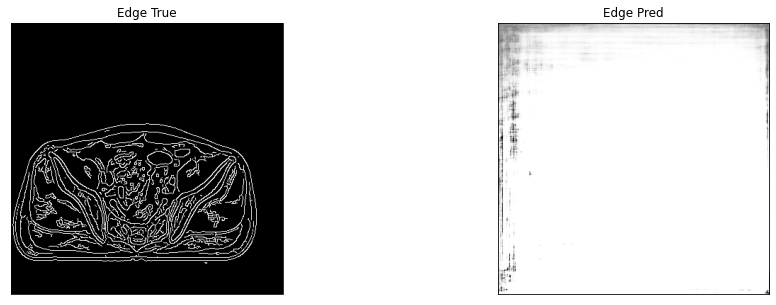

edge of ct_pred = 0.5004299879074097, edge of ct_true = 0.5000359416007996
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0023, device='cuda:0') tensor(1., device='cuda:0')


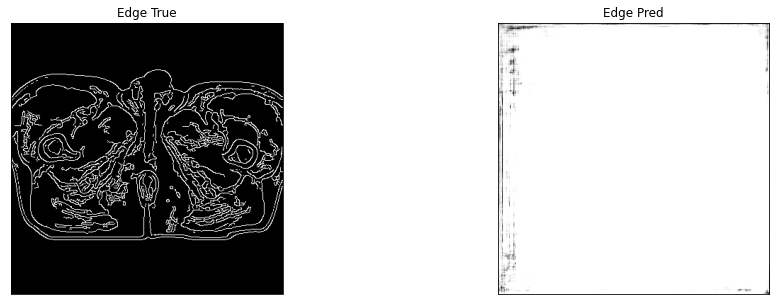

edge of ct_pred = 0.5004674196243286, edge of ct_true = 0.5000393986701965
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0036, device='cuda:0') tensor(1., device='cuda:0')


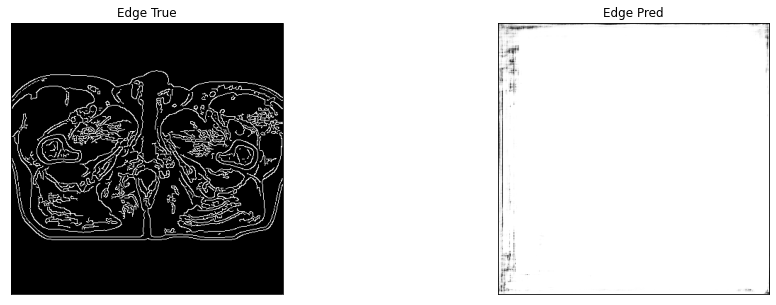

edge of ct_pred = 0.5004211664199829, edge of ct_true = 0.5000399947166443
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0020, device='cuda:0') tensor(1., device='cuda:0')


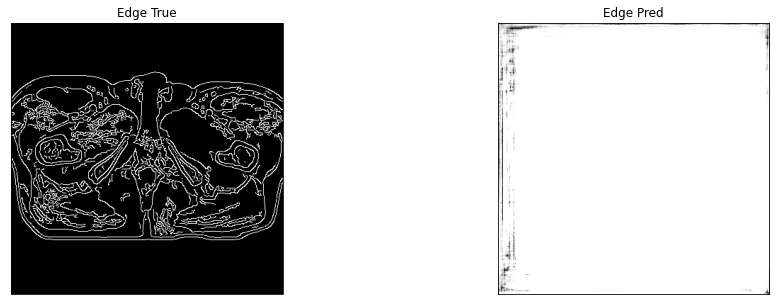

7it [00:17,  2.42s/it]

edge of ct_pred = 0.500411331653595, edge of ct_true = 0.5000346302986145
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0038, device='cuda:0') tensor(1., device='cuda:0')


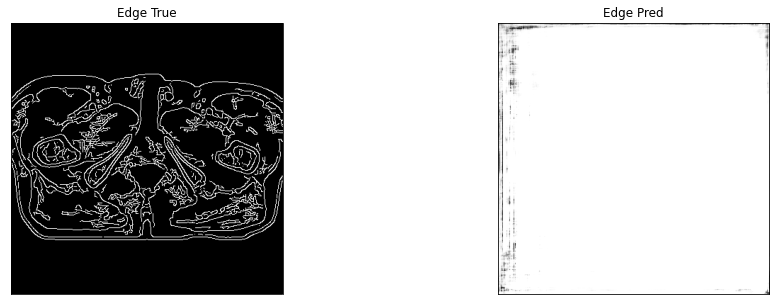

edge of ct_pred = 0.5004109740257263, edge of ct_true = 0.5000353455543518
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0025, device='cuda:0') tensor(1., device='cuda:0')


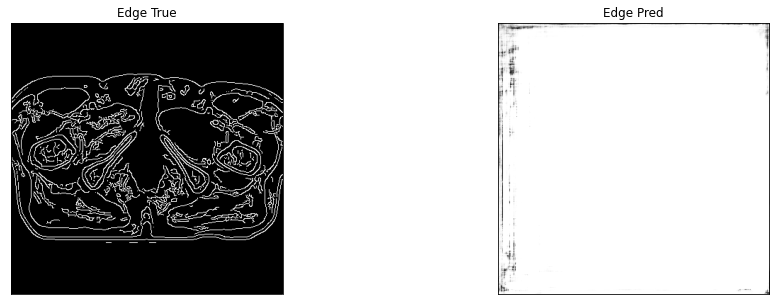

edge of ct_pred = 0.5003851652145386, edge of ct_true = 0.5000332593917847
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0131, device='cuda:0') tensor(1., device='cuda:0')


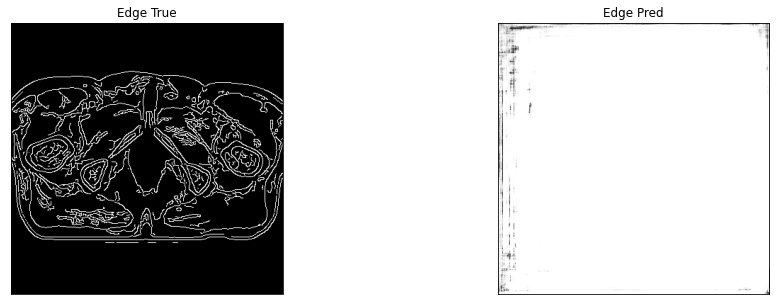

edge of ct_pred = 0.5004271268844604, edge of ct_true = 0.5000345706939697
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0046, device='cuda:0') tensor(1., device='cuda:0')


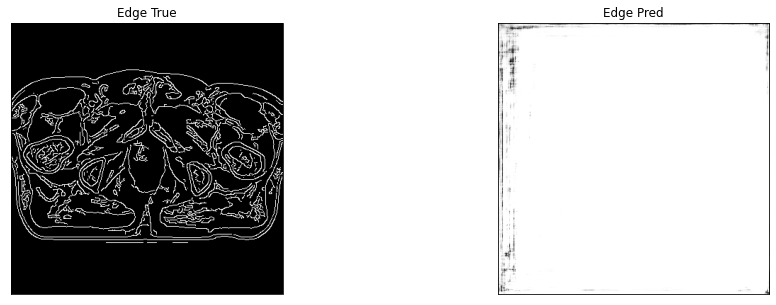

edge of ct_pred = 0.5003681182861328, edge of ct_true = 0.5000355243682861
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0027, device='cuda:0') tensor(1., device='cuda:0')


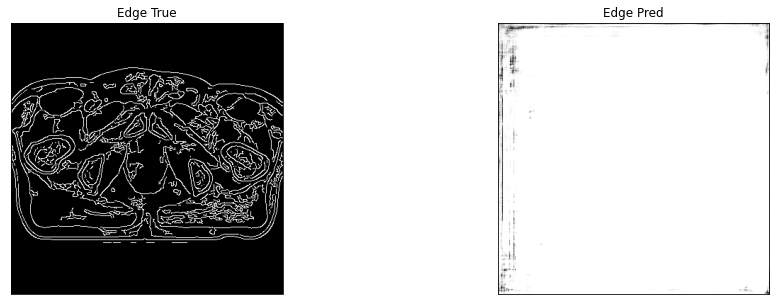

edge of ct_pred = 0.5003867745399475, edge of ct_true = 0.5000341534614563
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0017, device='cuda:0') tensor(1., device='cuda:0')


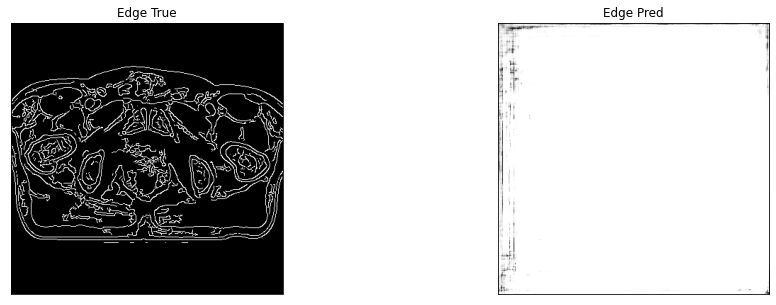

edge of ct_pred = 0.5003882646560669, edge of ct_true = 0.5000336766242981
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0088, device='cuda:0') tensor(1., device='cuda:0')


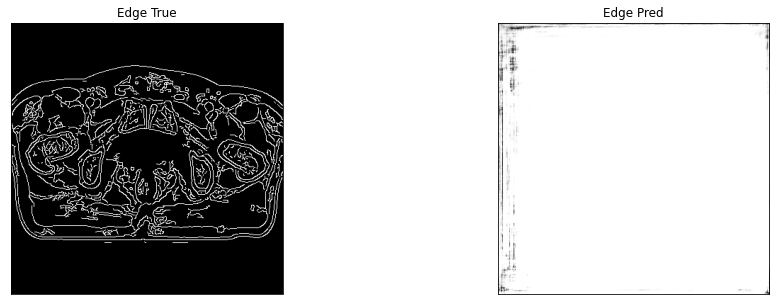

edge of ct_pred = 0.5003896951675415, edge of ct_true = 0.5000388622283936
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0062, device='cuda:0') tensor(1., device='cuda:0')


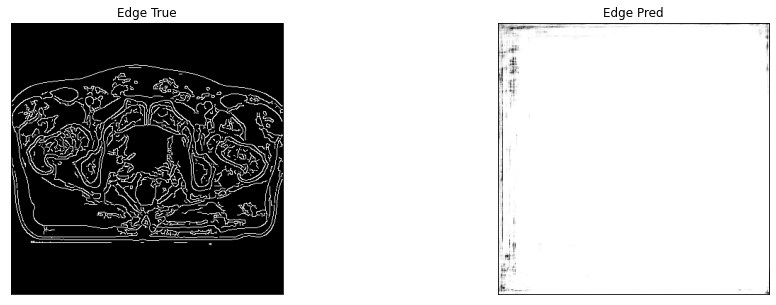

edge of ct_pred = 0.5003961324691772, edge of ct_true = 0.5000481009483337
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0038, device='cuda:0') tensor(1., device='cuda:0')


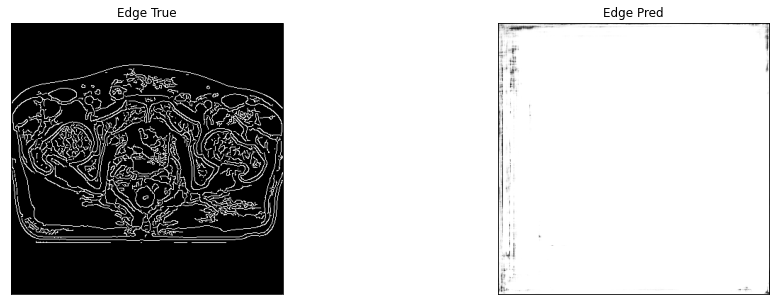

edge of ct_pred = 0.5004148483276367, edge of ct_true = 0.5000436305999756
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0035, device='cuda:0') tensor(1., device='cuda:0')


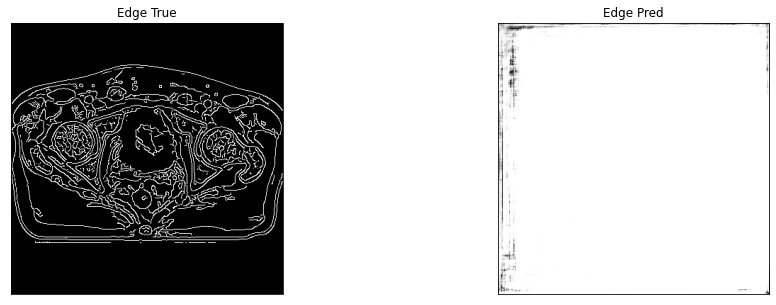

edge of ct_pred = 0.5003737807273865, edge of ct_true = 0.5000473856925964
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0018, device='cuda:0') tensor(1., device='cuda:0')


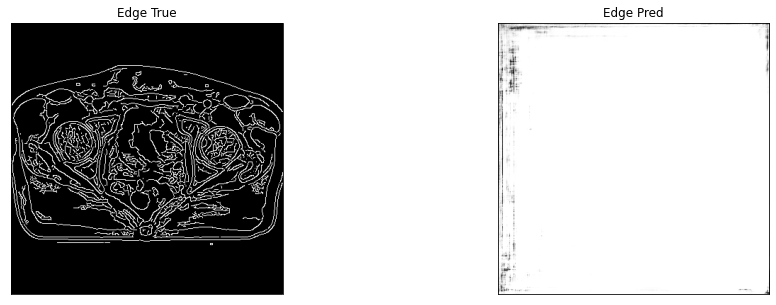

edge of ct_pred = 0.5003961324691772, edge of ct_true = 0.5000430941581726
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0031, device='cuda:0') tensor(1., device='cuda:0')


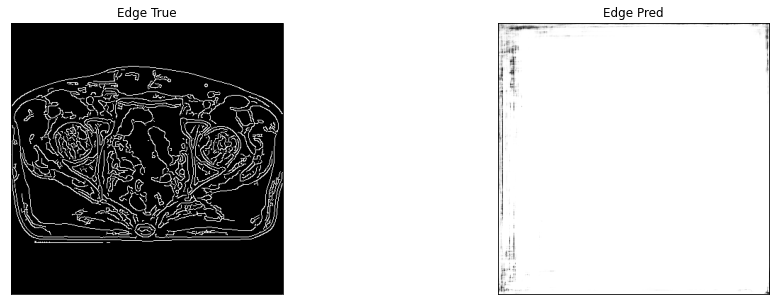

edge of ct_pred = 0.5003810524940491, edge of ct_true = 0.5000367760658264
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0056, device='cuda:0') tensor(1., device='cuda:0')


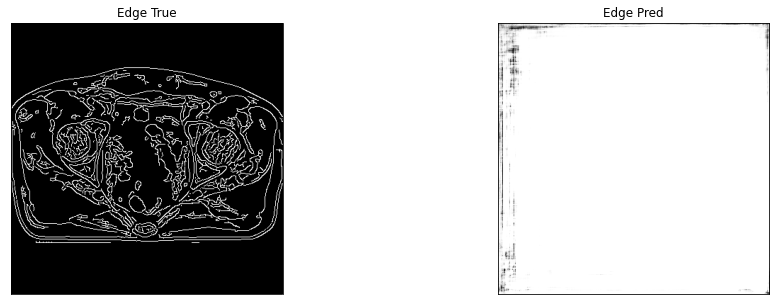

edge of ct_pred = 0.5003886818885803, edge of ct_true = 0.5000402331352234
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0091, device='cuda:0') tensor(1., device='cuda:0')


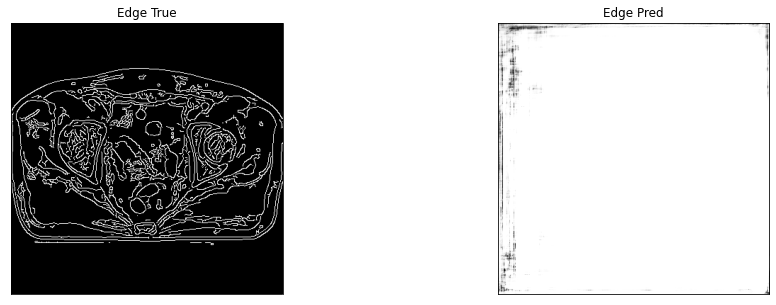

edge of ct_pred = 0.5003673434257507, edge of ct_true = 0.5000367760658264
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0051, device='cuda:0') tensor(1., device='cuda:0')


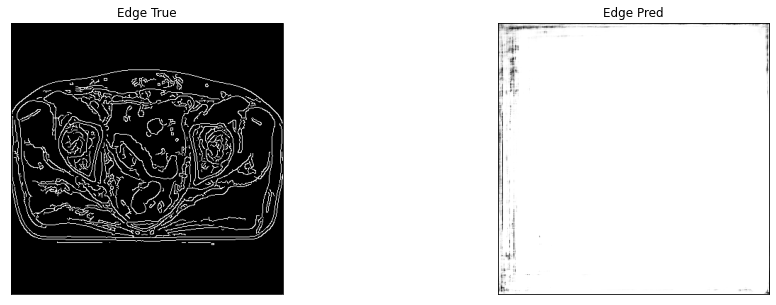

edge of ct_pred = 0.5004203915596008, edge of ct_true = 0.5000361800193787
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0061, device='cuda:0') tensor(1., device='cuda:0')


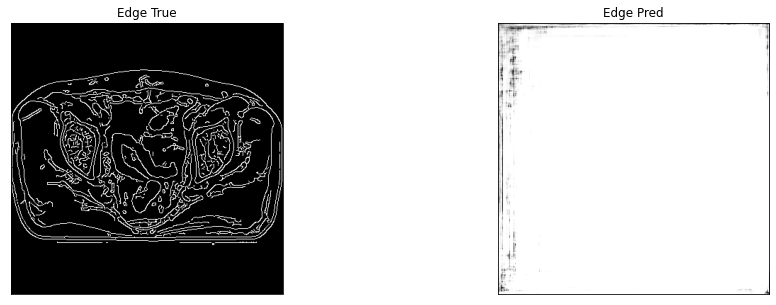

8it [00:19,  2.38s/it]

edge of ct_pred = 0.5003588199615479, edge of ct_true = 0.5000365376472473
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0037, device='cuda:0') tensor(1., device='cuda:0')


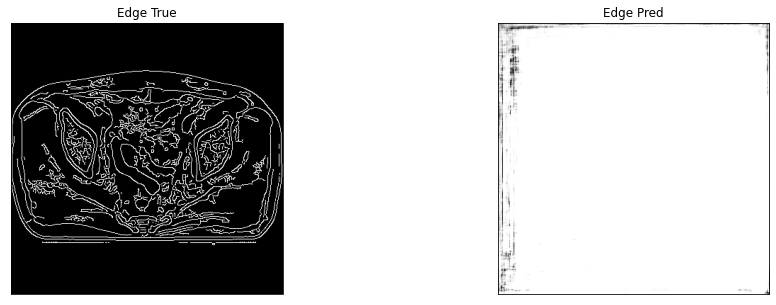

edge of ct_pred = 0.5003684759140015, edge of ct_true = 0.500034511089325
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0105, device='cuda:0') tensor(1., device='cuda:0')


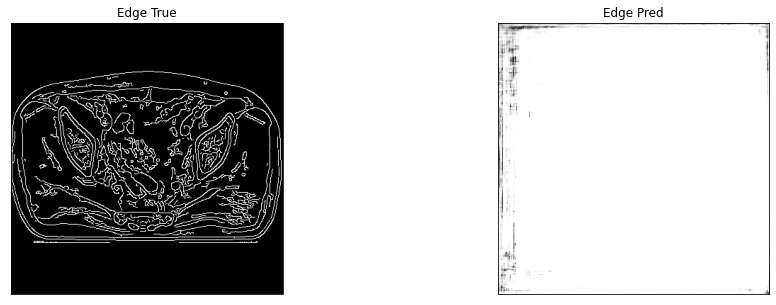

edge of ct_pred = 0.5003835558891296, edge of ct_true = 0.5000354647636414
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0023, device='cuda:0') tensor(1., device='cuda:0')


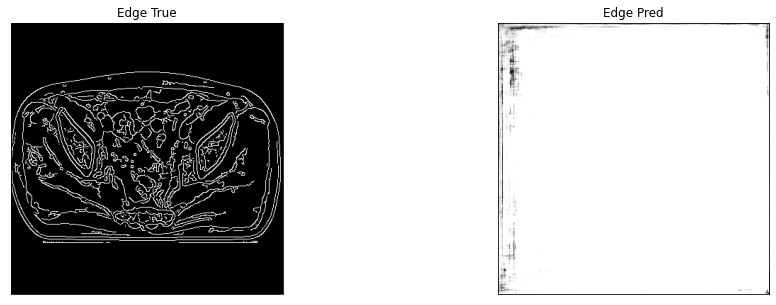

edge of ct_pred = 0.5004265308380127, edge of ct_true = 0.5000337362289429
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0052, device='cuda:0') tensor(1., device='cuda:0')


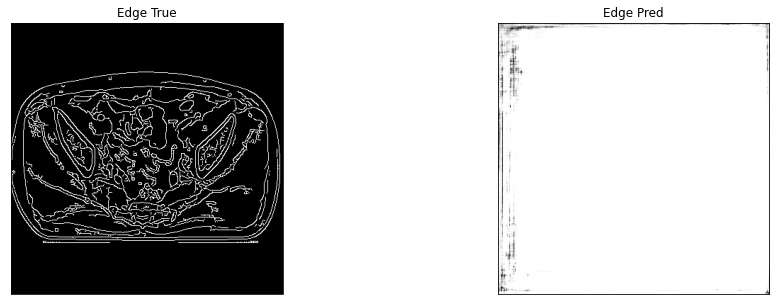

edge of ct_pred = 0.5003821849822998, edge of ct_true = 0.5000361204147339
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0063, device='cuda:0') tensor(1., device='cuda:0')


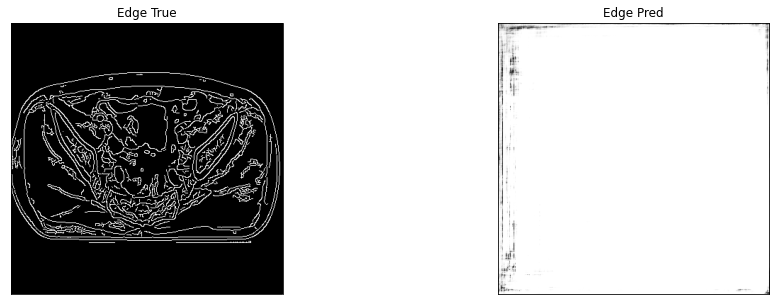

edge of ct_pred = 0.5004009008407593, edge of ct_true = 0.5000404119491577
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0184, device='cuda:0') tensor(1., device='cuda:0')


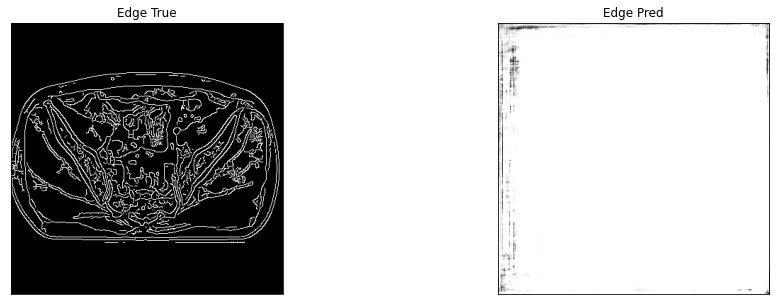

edge of ct_pred = 0.500393271446228, edge of ct_true = 0.5000401735305786
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0133, device='cuda:0') tensor(1., device='cuda:0')


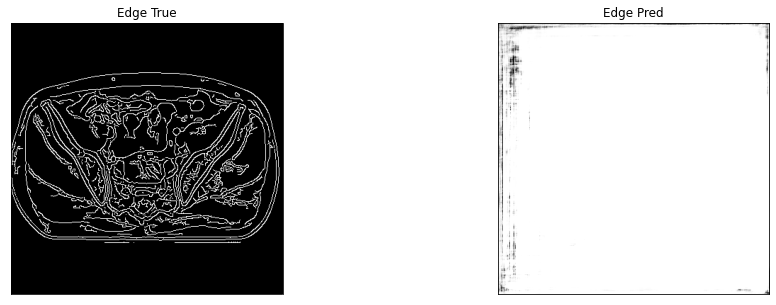

edge of ct_pred = 0.5004156827926636, edge of ct_true = 0.5000419616699219
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0015, device='cuda:0') tensor(1., device='cuda:0')


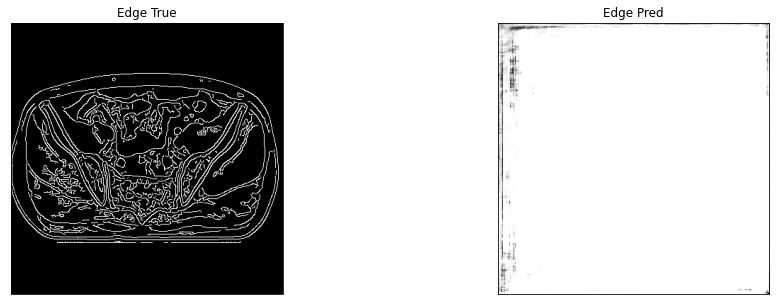

edge of ct_pred = 0.5003496408462524, edge of ct_true = 0.500038206577301
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0050, device='cuda:0') tensor(1., device='cuda:0')


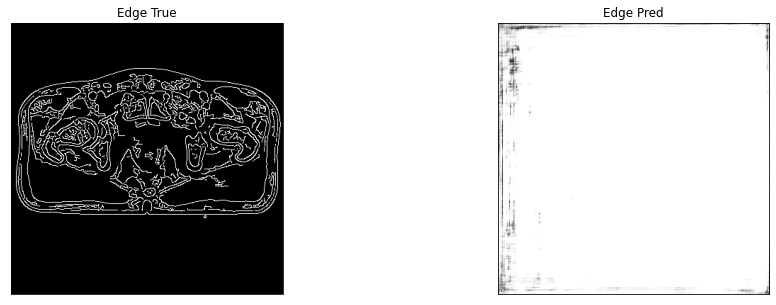

edge of ct_pred = 0.5003843307495117, edge of ct_true = 0.5000393986701965
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0073, device='cuda:0') tensor(1., device='cuda:0')


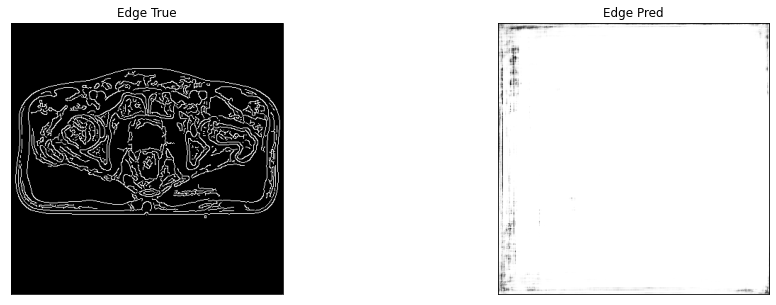

edge of ct_pred = 0.5003769397735596, edge of ct_true = 0.5000407099723816
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0136, device='cuda:0') tensor(1., device='cuda:0')


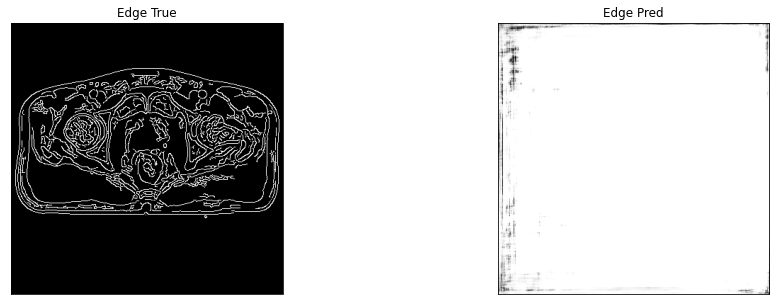

edge of ct_pred = 0.5003924369812012, edge of ct_true = 0.5000444650650024
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0056, device='cuda:0') tensor(1., device='cuda:0')


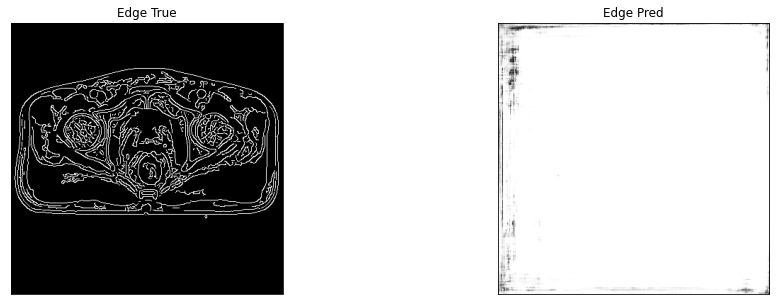

edge of ct_pred = 0.5003986954689026, edge of ct_true = 0.5000413656234741
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0033, device='cuda:0') tensor(1., device='cuda:0')


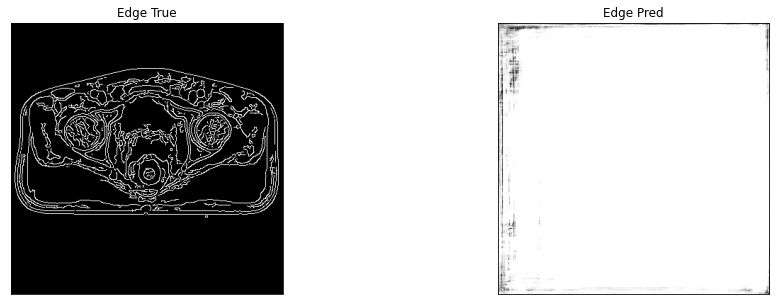

edge of ct_pred = 0.5004003047943115, edge of ct_true = 0.5000422596931458
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0061, device='cuda:0') tensor(1., device='cuda:0')


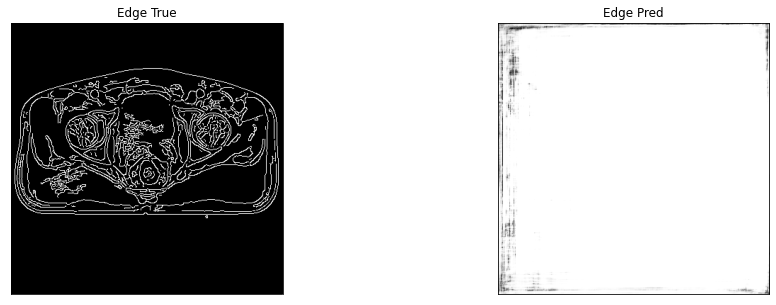

edge of ct_pred = 0.5003597736358643, edge of ct_true = 0.50003981590271
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0251, device='cuda:0') tensor(1., device='cuda:0')


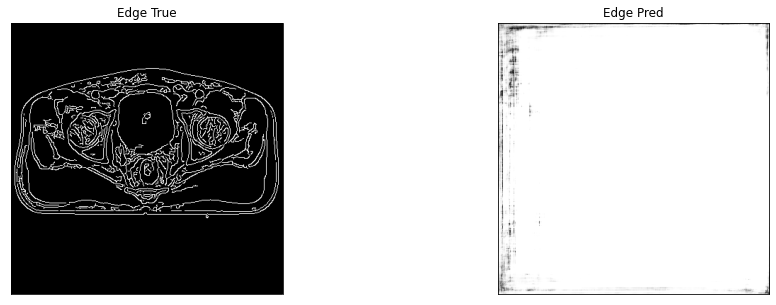

edge of ct_pred = 0.5003711581230164, edge of ct_true = 0.5000402927398682
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0039, device='cuda:0') tensor(1., device='cuda:0')


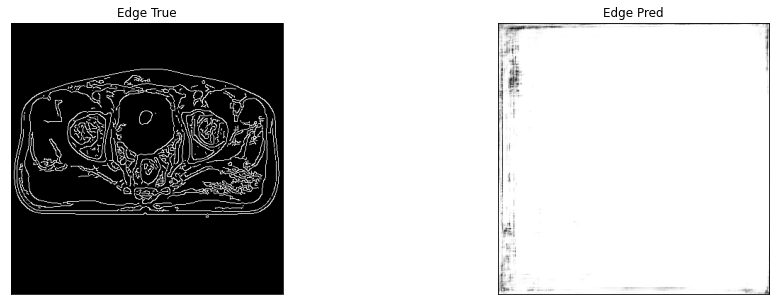

9it [00:21,  2.33s/it]

edge of ct_pred = 0.5003694891929626, edge of ct_true = 0.5000379681587219
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0086, device='cuda:0') tensor(1., device='cuda:0')


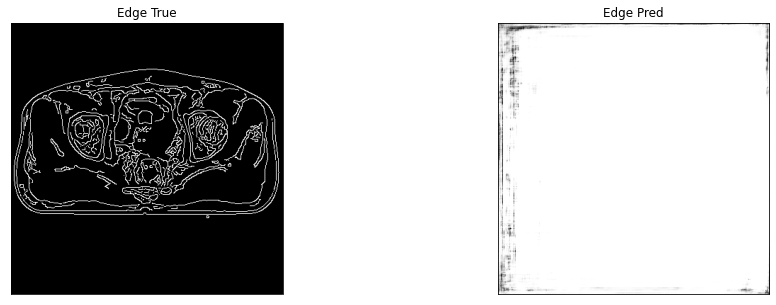

edge of ct_pred = 0.5003736615180969, edge of ct_true = 0.500037670135498
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0044, device='cuda:0') tensor(1., device='cuda:0')


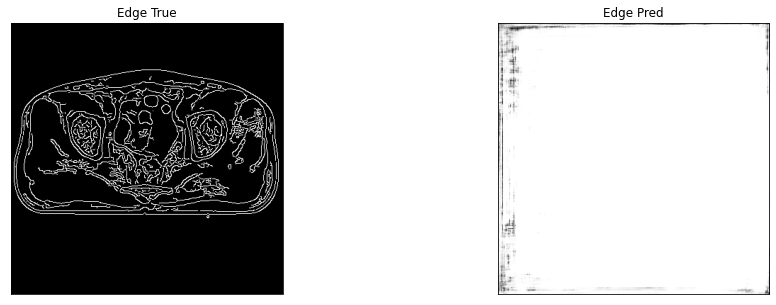

edge of ct_pred = 0.5003936886787415, edge of ct_true = 0.5000389218330383
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0125, device='cuda:0') tensor(1., device='cuda:0')


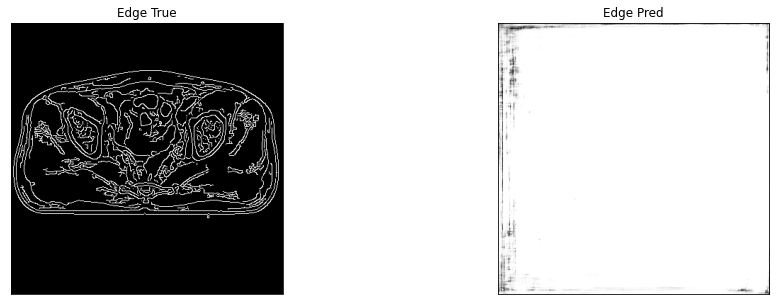

edge of ct_pred = 0.5003470778465271, edge of ct_true = 0.5000406503677368
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0206, device='cuda:0') tensor(1., device='cuda:0')


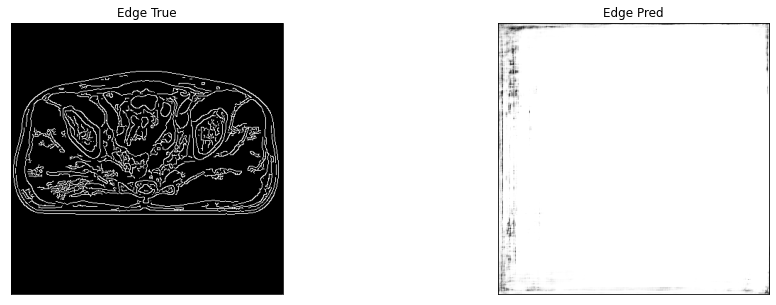

edge of ct_pred = 0.500338077545166, edge of ct_true = 0.5000410079956055
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0220, device='cuda:0') tensor(1., device='cuda:0')


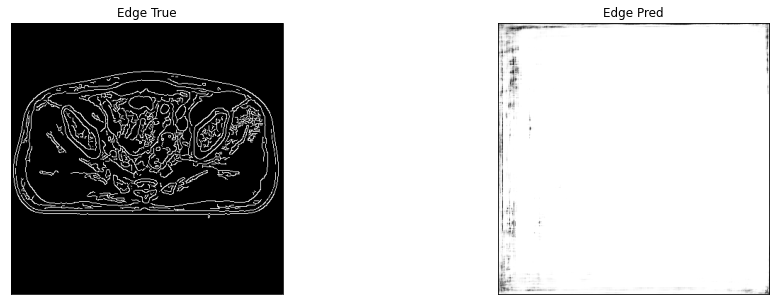

edge of ct_pred = 0.5003963708877563, edge of ct_true = 0.5000415444374084
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0061, device='cuda:0') tensor(1., device='cuda:0')


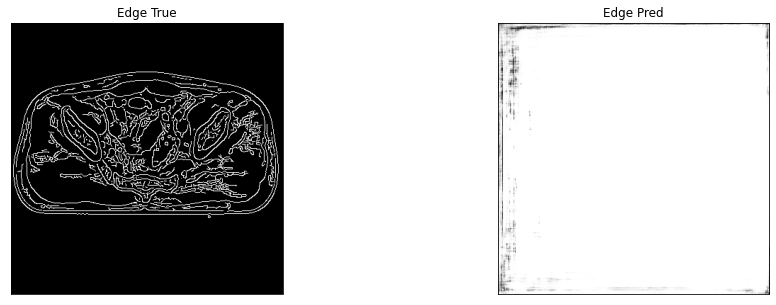

edge of ct_pred = 0.500374436378479, edge of ct_true = 0.5000461339950562
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0036, device='cuda:0') tensor(1., device='cuda:0')


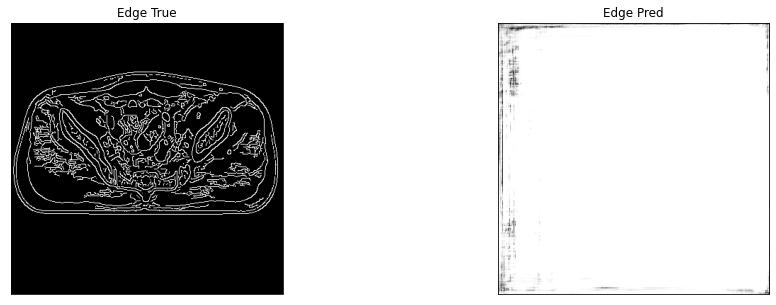

edge of ct_pred = 0.5003676414489746, edge of ct_true = 0.5000447630882263
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0140, device='cuda:0') tensor(1., device='cuda:0')


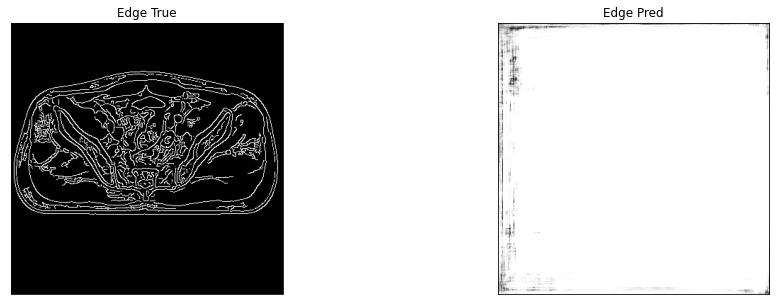

edge of ct_pred = 0.5003709197044373, edge of ct_true = 0.5000394582748413
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0229, device='cuda:0') tensor(1., device='cuda:0')


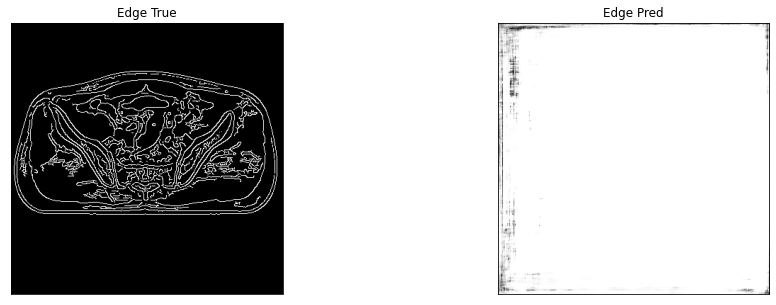

edge of ct_pred = 0.5003690123558044, edge of ct_true = 0.5000421404838562
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0046, device='cuda:0') tensor(1., device='cuda:0')


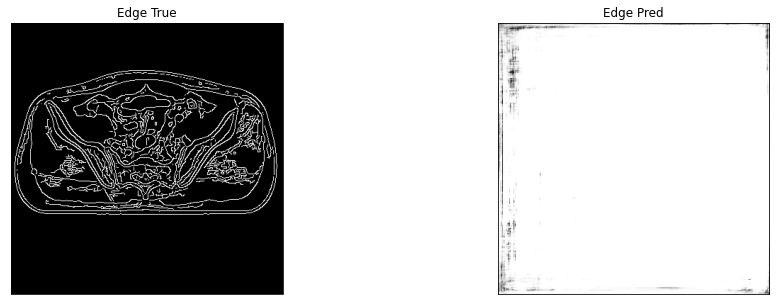

edge of ct_pred = 0.5003579258918762, edge of ct_true = 0.500041127204895
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0163, device='cuda:0') tensor(1., device='cuda:0')


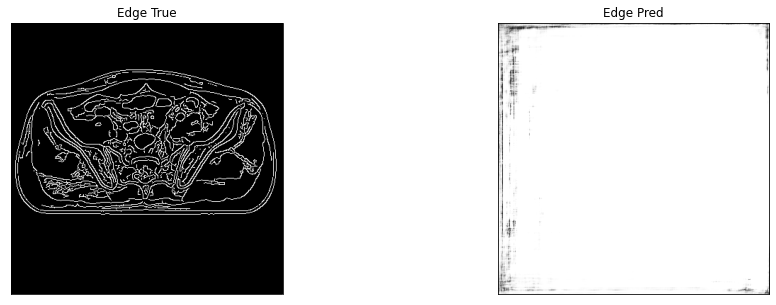

edge of ct_pred = 0.5003936290740967, edge of ct_true = 0.5000399351119995
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0239, device='cuda:0') tensor(1., device='cuda:0')


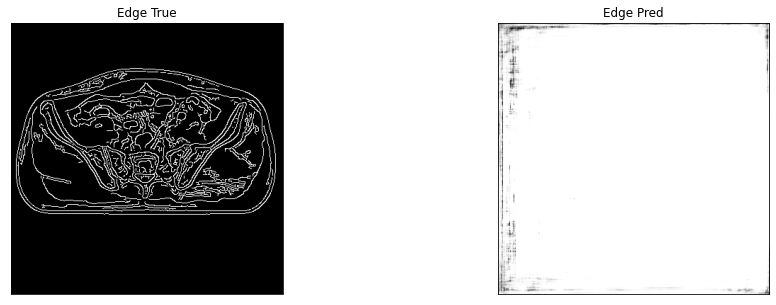

edge of ct_pred = 0.5003921389579773, edge of ct_true = 0.5000430941581726
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0091, device='cuda:0') tensor(1., device='cuda:0')


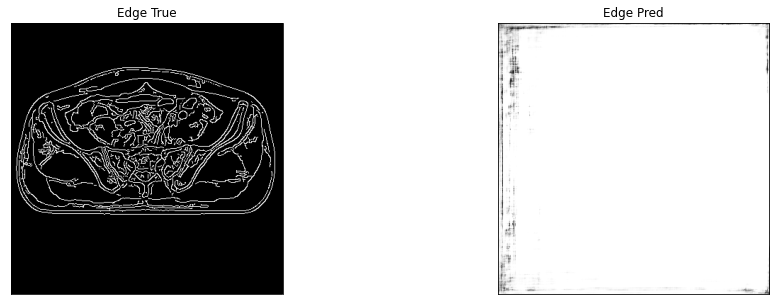

edge of ct_pred = 0.5003706812858582, edge of ct_true = 0.5000420808792114
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0073, device='cuda:0') tensor(1., device='cuda:0')


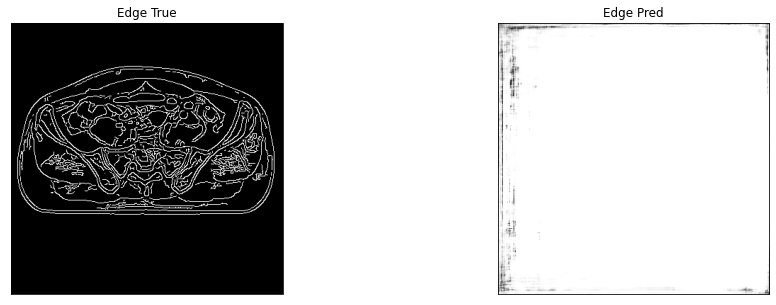

edge of ct_pred = 0.5003455877304077, edge of ct_true = 0.5000378489494324
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0142, device='cuda:0') tensor(1., device='cuda:0')


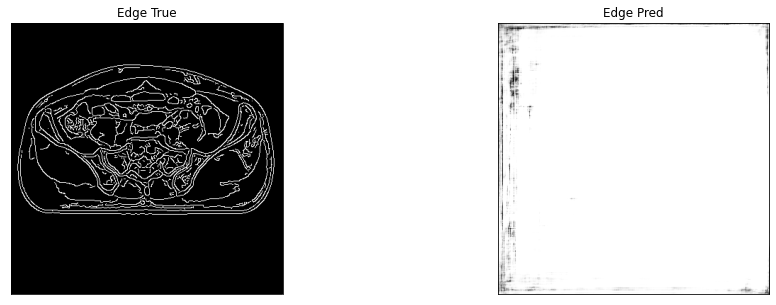

edge of ct_pred = 0.5003593564033508, edge of ct_true = 0.5000380873680115
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0236, device='cuda:0') tensor(1., device='cuda:0')


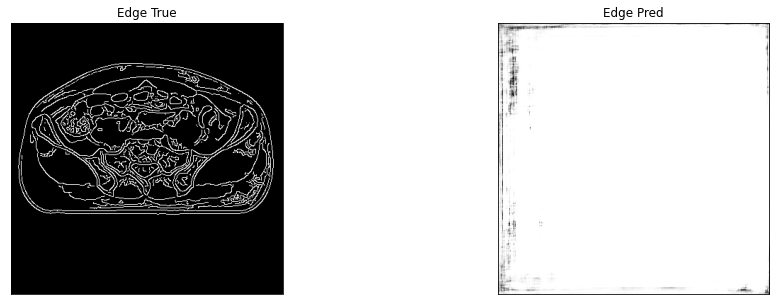

10it [00:23,  2.34s/it]

edge of ct_pred = 0.5003587007522583, edge of ct_true = 0.5000402927398682
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0120, device='cuda:0') tensor(1., device='cuda:0')


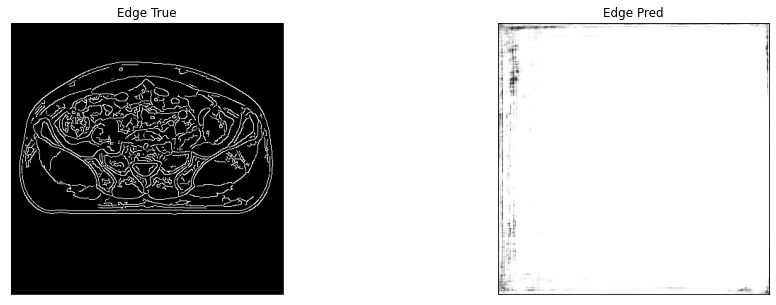

edge of ct_pred = 0.5003825426101685, edge of ct_true = 0.5000402927398682
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0254, device='cuda:0') tensor(1., device='cuda:0')


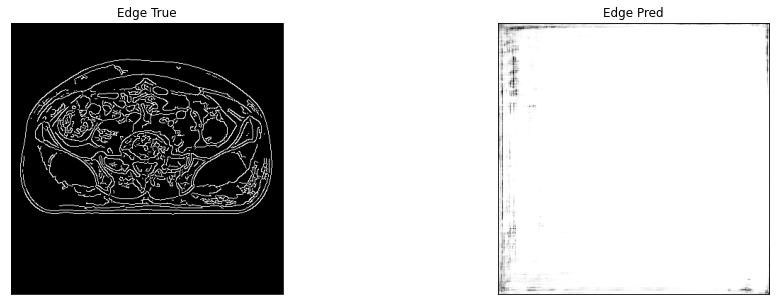

edge of ct_pred = 0.5003887414932251, edge of ct_true = 0.5000406503677368
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0059, device='cuda:0') tensor(1., device='cuda:0')


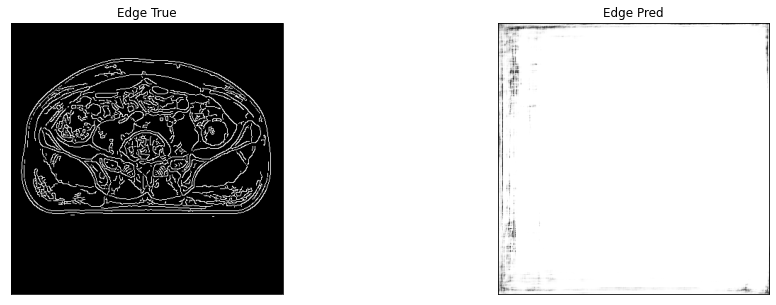

edge of ct_pred = 0.5003513097763062, edge of ct_true = 0.500040590763092
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0062, device='cuda:0') tensor(1., device='cuda:0')


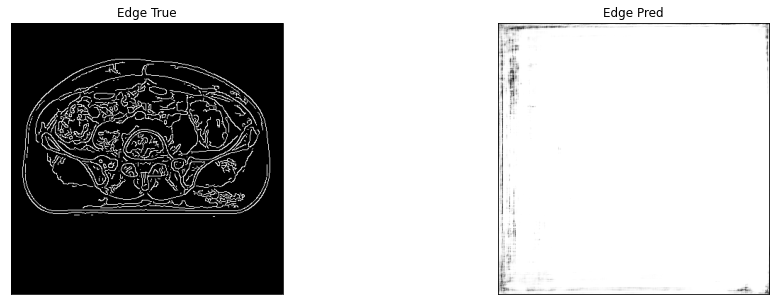

edge of ct_pred = 0.5003639459609985, edge of ct_true = 0.5000435709953308
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0032, device='cuda:0') tensor(1., device='cuda:0')


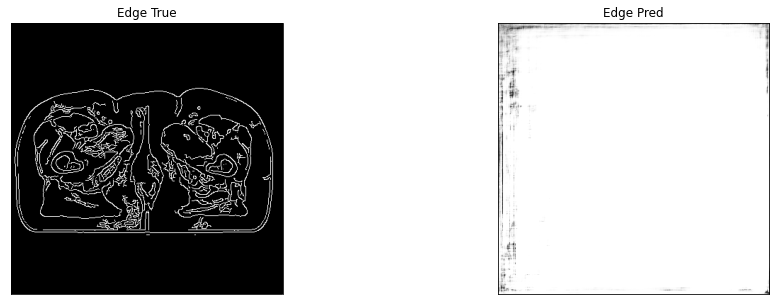

edge of ct_pred = 0.5003597736358643, edge of ct_true = 0.5000413060188293
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0032, device='cuda:0') tensor(1., device='cuda:0')


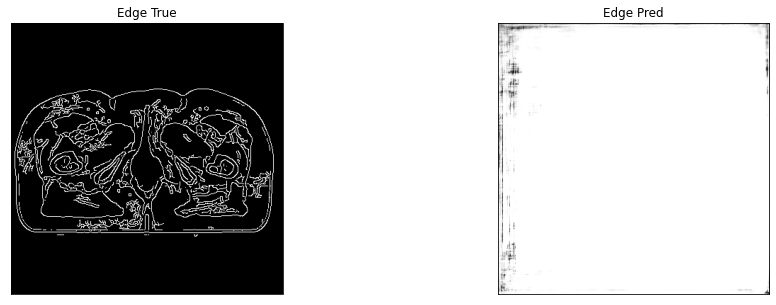

edge of ct_pred = 0.5003693699836731, edge of ct_true = 0.5000430941581726
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0041, device='cuda:0') tensor(1., device='cuda:0')


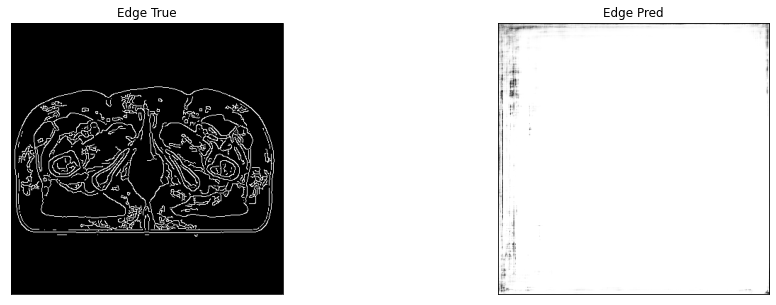

edge of ct_pred = 0.5003650784492493, edge of ct_true = 0.5000423192977905
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0058, device='cuda:0') tensor(1., device='cuda:0')


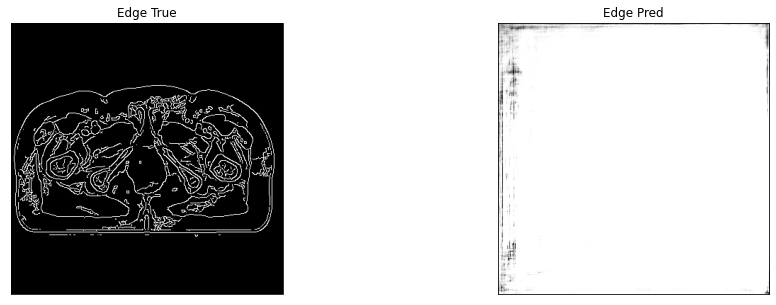

edge of ct_pred = 0.5003790855407715, edge of ct_true = 0.5000429153442383
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0033, device='cuda:0') tensor(1., device='cuda:0')


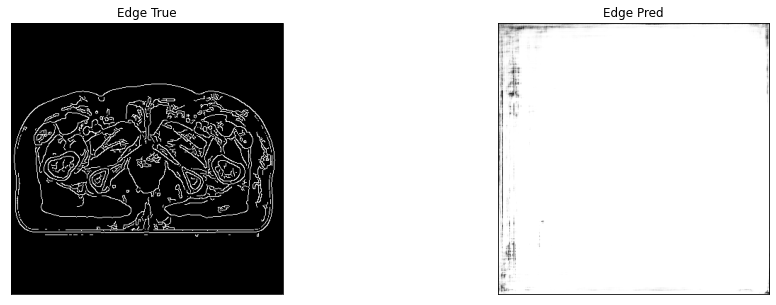

edge of ct_pred = 0.5003592371940613, edge of ct_true = 0.5000420808792114
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0103, device='cuda:0') tensor(1., device='cuda:0')


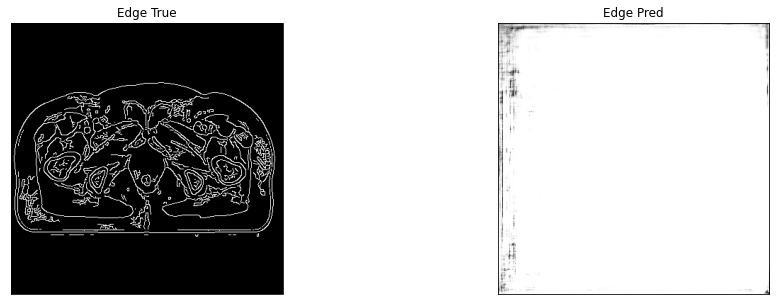

edge of ct_pred = 0.5003579258918762, edge of ct_true = 0.5000444054603577
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0007, device='cuda:0') tensor(1., device='cuda:0')


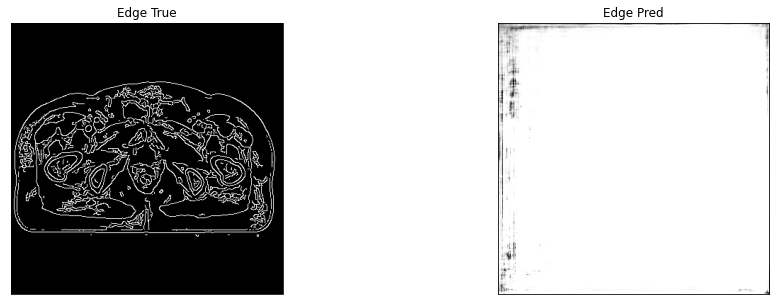

edge of ct_pred = 0.5003504157066345, edge of ct_true = 0.500041127204895
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0033, device='cuda:0') tensor(1., device='cuda:0')


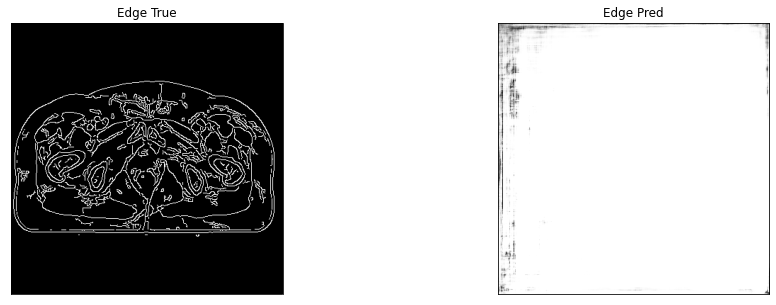

edge of ct_pred = 0.5003749132156372, edge of ct_true = 0.5000455975532532
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0015, device='cuda:0') tensor(1., device='cuda:0')


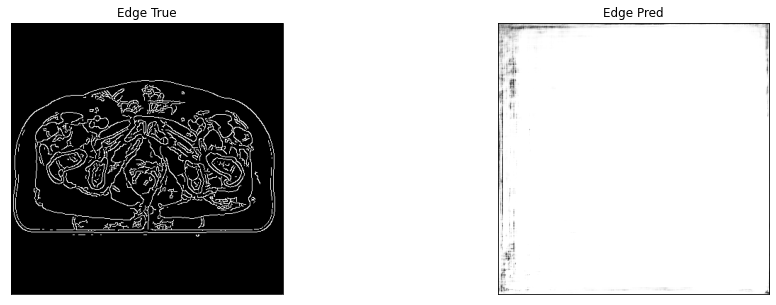

edge of ct_pred = 0.5003557801246643, edge of ct_true = 0.5000450015068054
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0059, device='cuda:0') tensor(1., device='cuda:0')


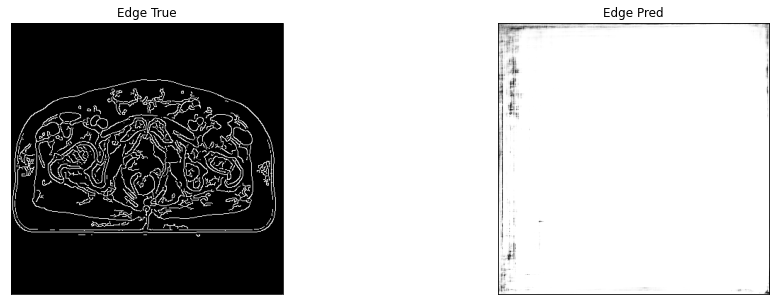

edge of ct_pred = 0.5003606081008911, edge of ct_true = 0.5000502467155457
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0008, device='cuda:0') tensor(1., device='cuda:0')


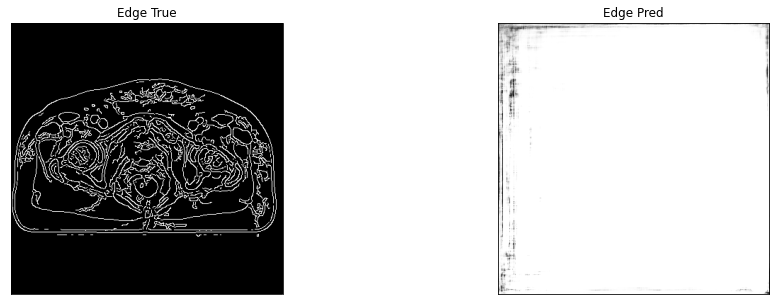

edge of ct_pred = 0.5003532767295837, edge of ct_true = 0.5000466704368591
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0030, device='cuda:0') tensor(1., device='cuda:0')


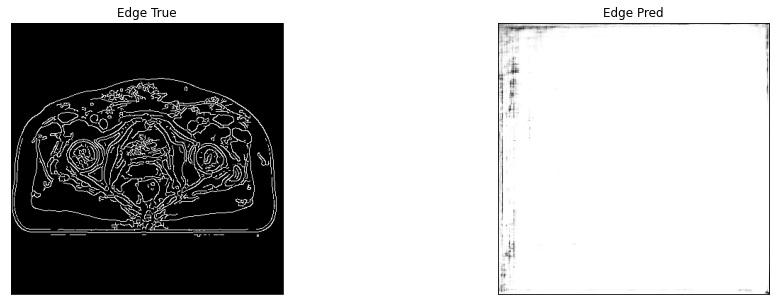

11it [00:26,  2.30s/it]

edge of ct_pred = 0.5003373026847839, edge of ct_true = 0.5000483989715576
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0146, device='cuda:0') tensor(1., device='cuda:0')


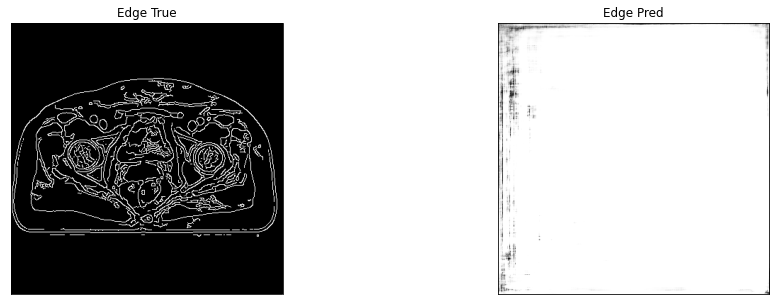

edge of ct_pred = 0.5003675222396851, edge of ct_true = 0.5000446438789368
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0050, device='cuda:0') tensor(1., device='cuda:0')


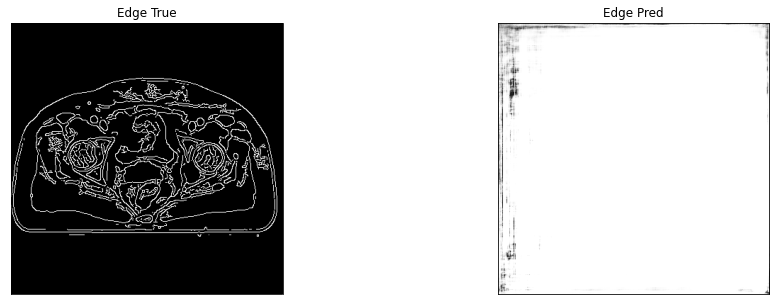

edge of ct_pred = 0.5003570914268494, edge of ct_true = 0.5000406503677368
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0204, device='cuda:0') tensor(1., device='cuda:0')


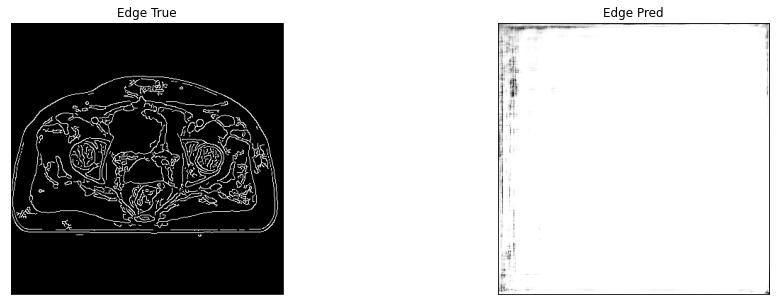

edge of ct_pred = 0.500369131565094, edge of ct_true = 0.5000399351119995
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0015, device='cuda:0') tensor(1., device='cuda:0')


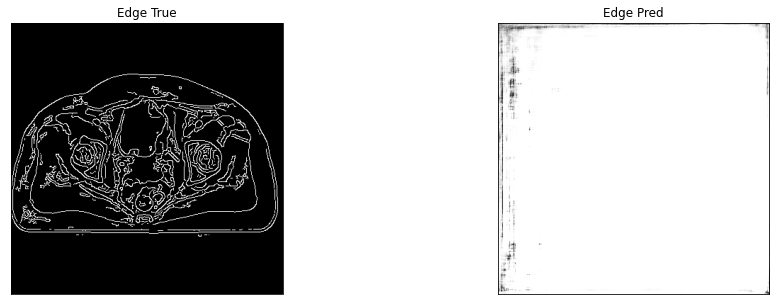

edge of ct_pred = 0.5003482103347778, edge of ct_true = 0.5000407099723816
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0196, device='cuda:0') tensor(1., device='cuda:0')


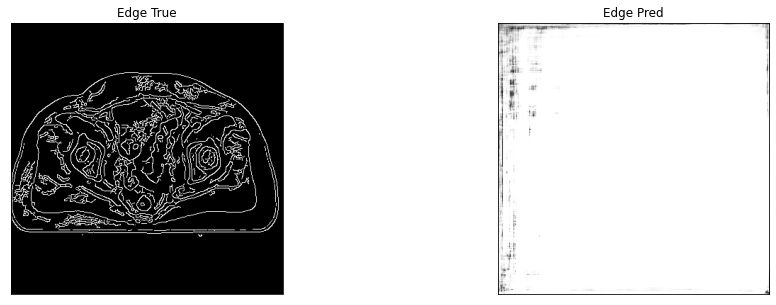

edge of ct_pred = 0.5003222823143005, edge of ct_true = 0.5000383853912354
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0011, device='cuda:0') tensor(1., device='cuda:0')


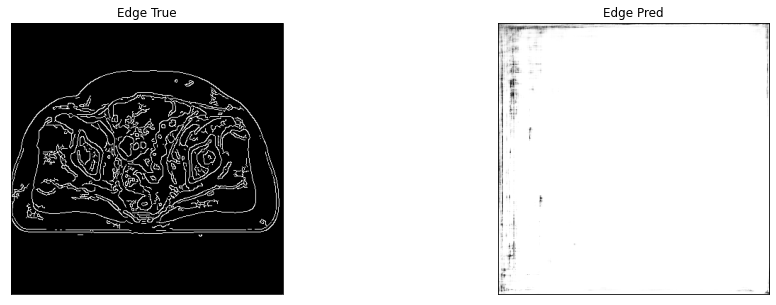

edge of ct_pred = 0.5003688931465149, edge of ct_true = 0.5000414252281189
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0078, device='cuda:0') tensor(1., device='cuda:0')


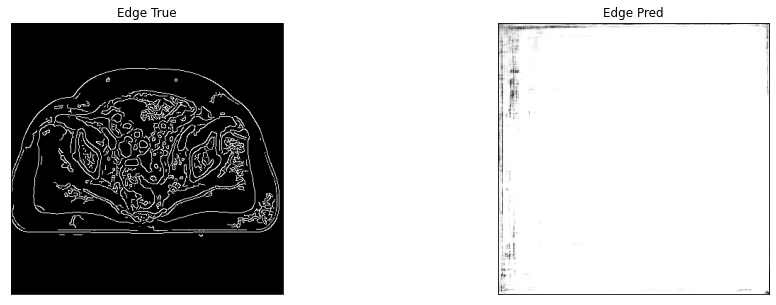

edge of ct_pred = 0.5003435611724854, edge of ct_true = 0.5000385642051697
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0015, device='cuda:0') tensor(1., device='cuda:0')


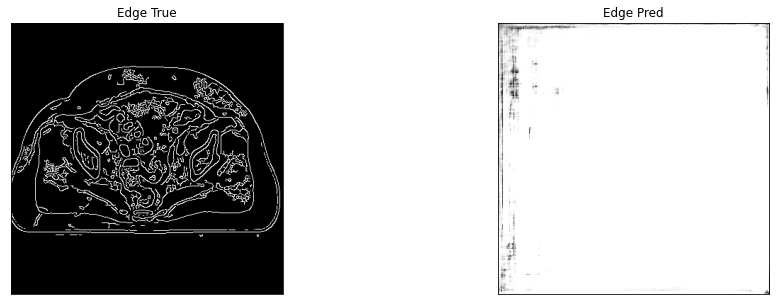

edge of ct_pred = 0.5003417730331421, edge of ct_true = 0.5000385046005249
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0011, device='cuda:0') tensor(1., device='cuda:0')


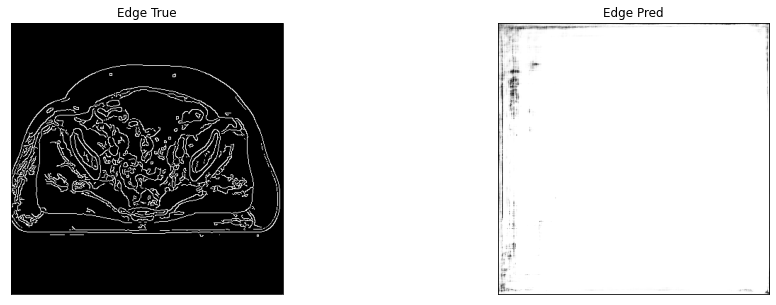

edge of ct_pred = 0.5003604888916016, edge of ct_true = 0.5000396966934204
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0159, device='cuda:0') tensor(1., device='cuda:0')


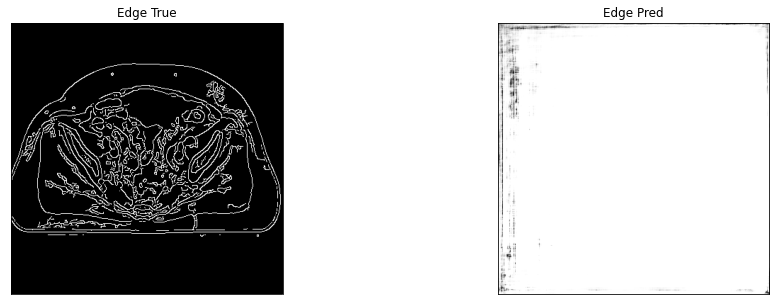

edge of ct_pred = 0.5003440380096436, edge of ct_true = 0.500039279460907
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0070, device='cuda:0') tensor(1., device='cuda:0')


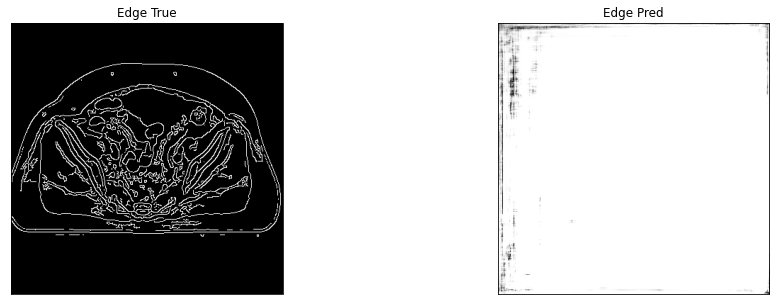

edge of ct_pred = 0.5003685355186462, edge of ct_true = 0.500042200088501
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0092, device='cuda:0') tensor(1., device='cuda:0')


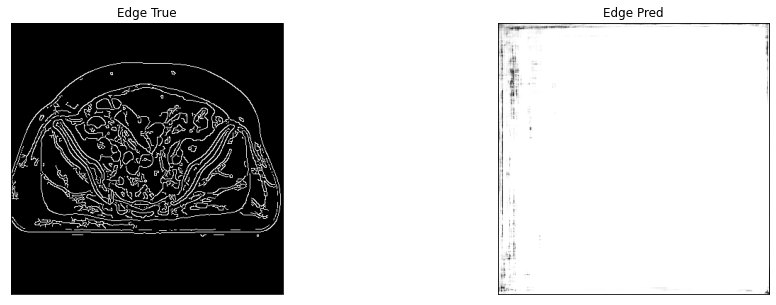

edge of ct_pred = 0.5003544688224792, edge of ct_true = 0.5000416040420532
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0045, device='cuda:0') tensor(1., device='cuda:0')


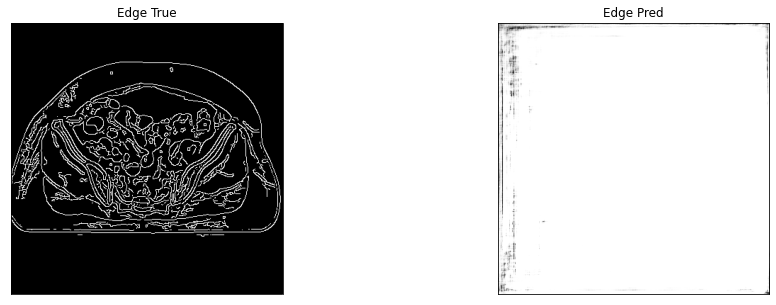

edge of ct_pred = 0.5003476142883301, edge of ct_true = 0.500037670135498
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0010, device='cuda:0') tensor(1., device='cuda:0')


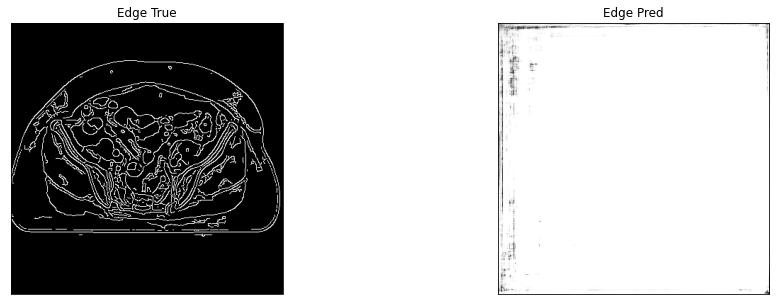

edge of ct_pred = 0.5003702044487, edge of ct_true = 0.5000420212745667
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(0.0006, device='cuda:0') tensor(1., device='cuda:0')


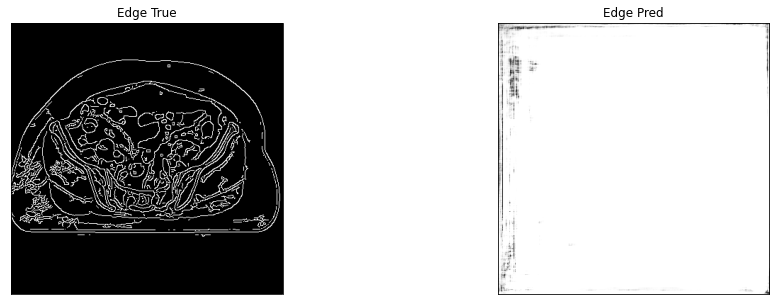

12it [00:28,  2.36s/it]


In [36]:
test_epoch(model, testloader, device, True, dir_path)

In [37]:
discriminator = Model(in_channel=DIS_IN_CHANNELS, n_classes=DIS_N_CLASSES, activation=DIS_ACT)

In [38]:
discriminator.load_state_dict(checkpoint["dicriminator"])

<All keys matched successfully>

In [39]:
# score_ssim_test, score_psnr_test, score_snr_test, score_mae_test, score_mask_test, score_acc_test 
# unmasked
eval_epoch(model, discriminator, testloader, device)

12it [00:05,  2.17it/s]


0.5

In [40]:
# import torchvision.models as models
# models.vgg16(pretrained=True)